In [3]:
import geopandas as gpd
import numpy as np
from sklearn.cluster import DBSCAN
from shapely.geometry import MultiPoint
import matplotlib.pyplot as plt

# Load the GeoPackage file
data = gpd.read_file('../data/DeadTrees_2023_Anis_ShapeStudy.gpkg')

# Check Coordinate Reference System (CRS) and reproject if necessary
if data.crs.is_geographic:
    # Example: Reproject to UTM Zone 10N (adjust based on data location)
    data = data.to_crs('EPSG:32610')

# Extract coordinates for clustering
coords = np.array([(geom.x, geom.y) for geom in data.geometry])

In [2]:
# Print the shape of the coords array
print(f"Shape of coords: {coords.shape}")

# Print the first few coordinates
print("First 5 coordinates:")
print(coords[:5])

# Print the shape of the coords array
if isinstance(coords, np.ndarray):
    print(f"Shape of coords: {coords.shape}")

    # Print the first few coordinates
    print("\nFirst 5 coordinates:")
    print(coords[:5])

    # Print the range of x and y coordinates
    x_coords = coords[:, 0]
    y_coords = coords[:, 1]
    print(f"\nX-coordinate range: {x_coords.min():.2f} to {x_coords.max():.2f}")
    print(f"Y-coordinate range: {y_coords.min():.2f} to {y_coords.max():.2f}")

    # Print the total number of locations
    print(f"\nTotal number of dead tree locations: {len(coords)}")
else:
    print("Warning: coords is not a numpy array")
    print(f"Type of coords: {type(coords)}")

# Print the total number of locations
print(f"Total number of dead tree locations: {len(coords)}")

Shape of coords: (698223, 2)
First 5 coordinates:
[[ 248450.87286325 6743402.65705128]
 [ 248223.78030303 6743430.84848485]
 [ 248222.08514493 6743441.50301932]
 [ 248461.93800813 6743465.46849593]
 [ 248358.67457806 6743492.81698312]]
Shape of coords: (698223, 2)

First 5 coordinates:
[[ 248450.87286325 6743402.65705128]
 [ 248223.78030303 6743430.84848485]
 [ 248222.08514493 6743441.50301932]
 [ 248461.93800813 6743465.46849593]
 [ 248358.67457806 6743492.81698312]]

X-coordinate range: 226611.09 to 631998.10
Y-coordinate range: 6708000.71 to 7529998.38

Total number of dead tree locations: 698223
Total number of dead tree locations: 698223


### Step 1. Create Clusters

In [3]:
# Test parameters
param_sets = [
    {"eps": 20, "min_samples": 3},  # Your choice
    {"eps": 30, "min_samples": 5},  # More conservative
    {"eps": 40, "min_samples": 10}  # Broad-scale clusters
]

# Compare cluster counts and sizes
for params in param_sets:
    db = DBSCAN(eps=params["eps"], min_samples=params["min_samples"]).fit(coords)
    labels = db.labels_
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    print(f"eps={params['eps']}, min_samples={params['min_samples']}: {n_clusters} clusters")

eps=20, min_samples=3: 43539 clusters
eps=30, min_samples=5: 19870 clusters
eps=40, min_samples=10: 6672 clusters


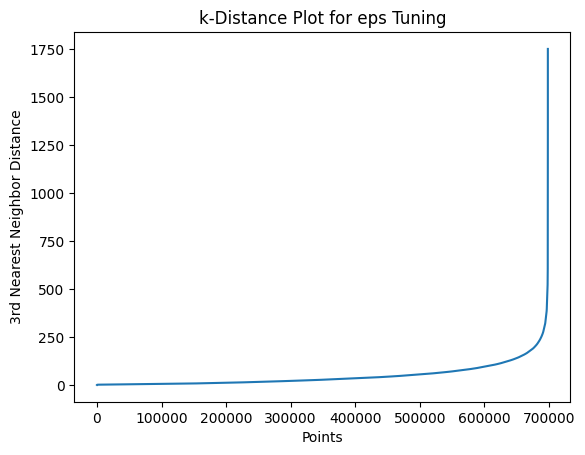

In [4]:
from sklearn.neighbors import NearestNeighbors
neighbors = NearestNeighbors(n_neighbors=3).fit(coords)
distances, _ = neighbors.kneighbors(coords)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.xlabel('Points')
plt.ylabel('3rd Nearest Neighbor Distance')
plt.title('k-Distance Plot for eps Tuning')
plt.show()

In [4]:
# Set DBSCAN parameters (tune these based on data)
eps = 20  # Meters (adjust based on spatial scale of clusters)
min_samples = 3  # Minimum points to form a cluster

# Perform clustering
db = DBSCAN(eps=eps, min_samples=min_samples, metric='euclidean').fit(coords)
labels = db.labels_

# Assign cluster labels to the GeoDataFrame
data['cluster'] = labels

# Remove noise (points not in any cluster)
clustered_data = data[data['cluster'] != -1]

### Step 2. Compute Metrics

In [6]:
from scipy.spatial import cKDTree
from scipy.stats import skew

def nearest_neighbor_metrics(points):
    tree = cKDTree(points)
    distances, _ = tree.query(points, k=2)  # k=2 for self + nearest neighbor
    nnd = distances[:, 1]  # Exclude self-distance
    return {
        'nnd_mean': np.mean(nnd),
        'nnd_std': np.std(nnd),
        'nnd_skew': skew(nnd)
    }

def clark_evans_index(points, area):
    n = len(points)
    expected_mean_nnd = 0.5 * np.sqrt(area / n)
    observed_mean_nnd = np.mean(nearest_neighbor_metrics(points)['nnd_mean'])
    return observed_mean_nnd / expected_mean_nnd  # <1 = clustered, >1 = dispersed

def fractal_dimension(points, thresholds=np.logspace(0, 3, 10)):
    counts = []
    for eps in thresholds:
        # Grid cells of size eps x eps
        bins_x = int(np.ceil((points[:,0].max() - points[:,0].min()) / eps))
        bins_y = int(np.ceil((points[:,1].max() - points[:,1].min()) / eps))
        count = np.histogram2d(points[:,0], points[:,1], bins=(bins_x, bins_y))[0]
        counts.append(np.sum(count > 0))
    return np.polyfit(np.log(1/thresholds), np.log(counts), 1)[0]

from shapely.ops import unary_union

def concavity_ratio(points, convex_hull_area):
    concave_hull = unary_union(points).convex_hull  # Approximation
    return concave_hull.area / convex_hull_area  # Lower = more concave

from sklearn.decomposition import PCA

def pca_orientation(points):
    pca = PCA(n_components=2).fit(points)
    return np.degrees(np.arctan2(*pca.components_[0]))  # Angle of primary axis

def anisotropy_index(points):
    pca = PCA(n_components=2).fit(points)
    return pca.explained_variance_ratio_[0] / pca.explained_variance_ratio_[1]

from esda.moran import Moran
from libpysal.weights import DistanceBand

def morans_i(points):
    w = DistanceBand.from_array(points, threshold=np.median(nearest_neighbor_metrics(points)['nnd_mean']))
    mi = Moran(np.ones(len(points)), w)  # Binary presence
    return mi.I

from alphashape import alphashape

def alpha_compactness(points, alpha=0.1):
    # Handle edge cases
    if len(points) < 3:
        return np.nan  # Alpha shape requires ≥3 points
    
    # Generate alpha shape
    alpha_shape = alphashape(points, alpha)
    
    # Check geometry validity
    if not alpha_shape.is_valid or alpha_shape.is_empty:
        return np.nan
    
    # Compute convex hull safely
    try:
        convex_hull = alpha_shape.convex_hull
        if convex_hull.area == 0:
            return np.nan
        return alpha_shape.area / convex_hull.area
    except:
        return np.nan

from scipy.spatial import Delaunay

def euler_number(points):
    tri = Delaunay(points)
    edges = set()
    for simplex in tri.simplices:
        edges.update([(simplex[0], simplex[1]), (simplex[1], simplex[2]), (simplex[0], simplex[2])])
    return len(points) - len(edges) + len(tri.simplices)  # V - E + F

In [7]:
import pandas as pd

from shapely.geometry import Polygon, LineString

# Initialize DataFrame to store metrics
metrics = []

for cluster_id in clustered_data['cluster'].unique():
    cluster_pts = clustered_data[clustered_data['cluster'] == cluster_id]
    points = np.array([(geom.x, geom.y) for geom in cluster_pts.geometry])
    
    # Existing metrics
    convex_hull = MultiPoint(points).convex_hull
    
    # Skip invalid/empty geometries or LineStrings
    if convex_hull.is_empty or isinstance(convex_hull, LineString):
        continue  # Skip clusters forming a straight line
    
    # Basic metrics
    area = convex_hull.area
    perimeter = convex_hull.length
    form_factor = (4 * np.pi * area) / (perimeter ** 2) if perimeter > 0 else np.nan
    
    # Compute elongation only if MBR is a Polygon
    mbr = convex_hull.minimum_rotated_rectangle
    if isinstance(mbr, Polygon):
        coords = list(mbr.exterior.coords)
        side1 = np.linalg.norm(np.array(coords[0]) - np.array(coords[1]))
        side2 = np.linalg.norm(np.array(coords[1]) - np.array(coords[2]))
        major, minor = (side1, side2) if side1 > side2 else (side2, side1)
        elongation = major / minor if minor > 0 else np.nan
    else:
        elongation = np.nan  # Handle LineString MBRs
    
    metrics.append({
        'cluster_id': cluster_id,
        'n_points': len(cluster_pts),
        'area': area,
        'perimeter': perimeter,
        'form_factor': form_factor,
        'elongation': elongation,
        'fractal_dim': fractal_dimension(points),
        'pca_angle': pca_orientation(points),
        'clark_evans': clark_evans_index(points, area),
        'alpha_compactness': alpha_compactness(points)
    })

metrics_df = pd.DataFrame(metrics)

### Plot-level Metrics

In [ ]:
# Get centroid coordinates for each cluster (EPSG:3067 for Finland)
cluster_centroids = (
    clustered_data.dissolve(by='cluster')
    .to_crs("EPSG:3067")
    .centroid
    .reset_index(name='geometry')
)
cluster_centroids['x'] = cluster_centroids.geometry.x
cluster_centroids['y'] = cluster_centroids.geometry.y

In [9]:
from sklearn.cluster import DBSCAN

# Cluster centroids into plots (eps = plot radius, e.g., 10 km)
coords = cluster_centroids[['x', 'y']].values
plot_labels = DBSCAN(eps=10000, min_samples=1).fit(coords).labels_

# Add plot_id to cluster_centroids and merge back to original data
cluster_centroids['plot_id'] = plot_labels

clustered_data = clustered_data.merge(
    cluster_centroids[['cluster', 'plot_id']], 
    on='cluster', 
    how='left'
)

metrics_df = metrics_df.merge(
    cluster_centroids[['cluster', 'plot_id']].rename(columns={'cluster': 'cluster_id'}), 
    on='cluster_id', 
    how='left'
)

In [10]:
# Aggregate metrics per plot
plot_metrics = metrics_df.groupby('plot_id').agg({
    'n_points': 'sum',        # Total dead trees in plot
    'cluster_id': 'count',       # Number of clusters in plot
    'area': 'mean',           # Average cluster area
    'elongation': 'mean'      # Average cluster elongation
}).reset_index()

print(plot_metrics)

   plot_id  n_points  cluster_id        area  elongation
0        0     23466        4661  216.450605    9.944343
1        1     83139       12193  414.178372   18.528218
2        2     46608        5710  460.432947    8.937538
3        3     20789        4087  172.772632   10.068396
4        4      7777        1433  204.244390   10.333485
5        5     95884       10636  573.762338    9.833970
6        6     23808        4819  284.432905   10.296449


### Step 3. Filtered Clusters

In [11]:
import pandas as pd

# Define boreal forest-specific thresholds
filters = {
    "min_trees": 5,       # Clusters with <5 trees likely noise (e.g., windthrows)
    "min_area": 100,      # 100 m² ≈ 0.01 ha (smallest ecologically meaningful patch)
    "max_elongation": 10  # Exclude extreme linear clusters (e.g., along roads)
}

# Filter clusters
filtered_metrics = metrics_df[
    (metrics_df["n_points"] >= filters["min_trees"]) &
    (metrics_df["area"] >= filters["min_area"]) &
    (metrics_df["elongation"] <= filters["max_elongation"])
]

# Merge filtered metrics back with spatial data
filtered_clusters = clustered_data.merge(
    filtered_metrics[["cluster_id"]].rename(columns={'cluster_id': 'cluster'}), 
    on="cluster", 
    how="inner"
)

filtered_metrics.tail()

,cluster_id,n_points,area,perimeter,form_factor,elongation,fractal_dim,pca_angle,clark_evans,alpha_compactness,plot_id
43527,43527,8,604.220396,132.937836,0.429643,3.193802,0.387462,79.026289,1.783559,1.000000,6
43531,43532,6,150.494613,74.199689,0.343500,4.846999,0.321412,-23.032425,2.797970,1.000000,6
43534,43534,7,260.677959,76.522945,0.559411,2.668787,0.360187,76.351714,1.984260,0.670888,6
43535,43535,5,273.075150,78.346794,0.559049,2.257480,0.308394,55.743689,2.750562,NaN,6
43538,43538,5,502.623498,98.812394,0.646889,2.231923,0.315952,95.858717,2.695081,NaN,6


In [12]:
# Boreal-specific summary stats
boreal_stats = filtered_metrics.describe()

# Focus on key metrics:
print(f"""
BOREAL FOREST CLUSTER SUMMARY (Finland):
- Total clusters: {len(filtered_metrics)}
- Mean cluster size: {boreal_stats.loc['mean', 'n_points']:.1f} trees
- Median area: {boreal_stats.loc['50%', 'area']:.0f} m²
- Clusters with elongation >5: {len(filtered_metrics[filtered_metrics['elongation'] > 5])} (potential linear features)
""")


BOREAL FOREST CLUSTER SUMMARY (Finland):
- Total clusters: 14582
- Mean cluster size: 13.8 trees
- Median area: 388 m²
- Clusters with elongation >5: 858 (potential linear features)



In [13]:
# Save filtered clusters to GeoPackage
filtered_clusters.to_file("output/Filtered_Clusters_Finland.gpkg", driver="GPKG")

# Optional: Add environmental covariates (e.g., soil type, elevation)
# Example: Merge with CORINE Land Cover data for Finland
# corine_data = gpd.read_file("path/to/CORINE_FI.gpkg")
# filtered_clusters_env = gpd.sjoin(filtered_clusters, corine_data, how="left", op="intersects")

### Step 4. Descriptive Statistics

         cluster_id      n_points           area     perimeter   form_factor  \
count  14582.000000  14582.000000   14582.000000  14582.000000  14582.000000   
mean   22123.650734     13.753120    1061.196557    115.383636      0.594548   
std    12522.519704     44.026232    5003.319794     85.485348      0.142519   
min        0.000000      5.000000     100.003114     38.491180      0.164117   
25%    11109.750000      6.000000     218.772902     72.599153      0.499990   
50%    22481.500000      8.000000     388.310932     94.044302      0.608703   
75%    33166.750000     12.000000     817.602838    129.056281      0.702684   
95%    41086.900000     34.000000    3137.585585    241.148471      0.803895   
max    43538.000000   2965.000000  349269.669564   2220.380034      0.922030   

         elongation   fractal_dim     pca_angle   clark_evans  \
count  14582.000000  14582.000000  14582.000000  14582.000000   
mean       2.548416      0.415055     45.474439      2.180424   
std 

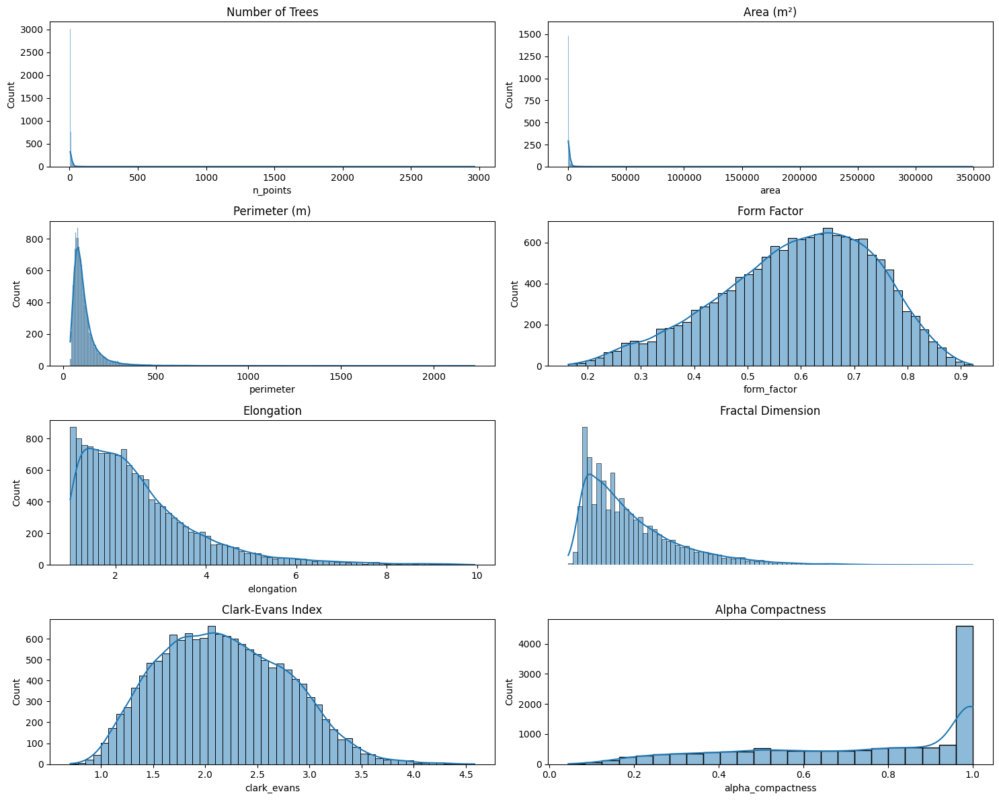

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

# Summary stats
print(filtered_metrics.describe(percentiles=[0.25, 0.5, 0.75, 0.95]))

# Plot distributions
fig, axes = plt.subplots(4, 2, figsize=(15, 12))
sns.histplot(filtered_metrics['n_points'], kde=True, ax=axes[0,0]).set_title('Number of Trees')
sns.histplot(filtered_metrics['area'], kde=True, ax=axes[0,1]).set_title('Area (m²)')
sns.histplot(filtered_metrics['perimeter'], kde=True, ax=axes[1,0]).set_title('Perimeter (m)')
sns.histplot(filtered_metrics['form_factor'], kde=True, ax=axes[1,1]).set_title('Form Factor')
sns.histplot(filtered_metrics['elongation'], kde=True, ax=axes[2,0]).set_title('Elongation')
sns.histplot(filtered_metrics['fractal_dim'], kde=True, ax=axes[2,1]).set_title('Fractal Dimension')
sns.histplot(filtered_metrics['clark_evans'], kde=True, ax=axes[3,0]).set_title('Clark-Evans Index')
sns.histplot(filtered_metrics['alpha_compactness'], kde=True, ax=axes[3,1]).set_title('Alpha Compactness')
axes[2,1].axis('off')
plt.tight_layout()
plt.show()

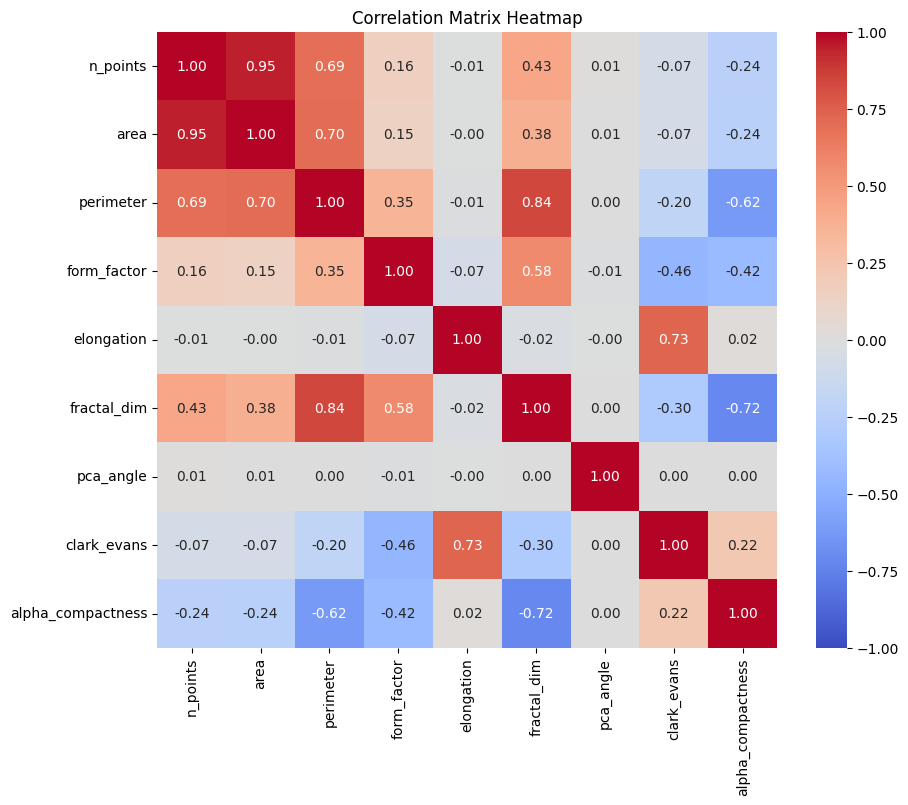

In [15]:
import seaborn as sns

# Select specific columns for correlation
selected_columns = ['n_points', 'area', 'perimeter', 'form_factor', 'elongation', 
                    'fractal_dim', 'pca_angle', 'clark_evans', 'alpha_compactness']

# Compute the correlation matrix
correlation_matrix = metrics_df[selected_columns].corr()

# Display the correlation matrix
import matplotlib.pyplot as plt

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation Matrix Heatmap")
plt.show()

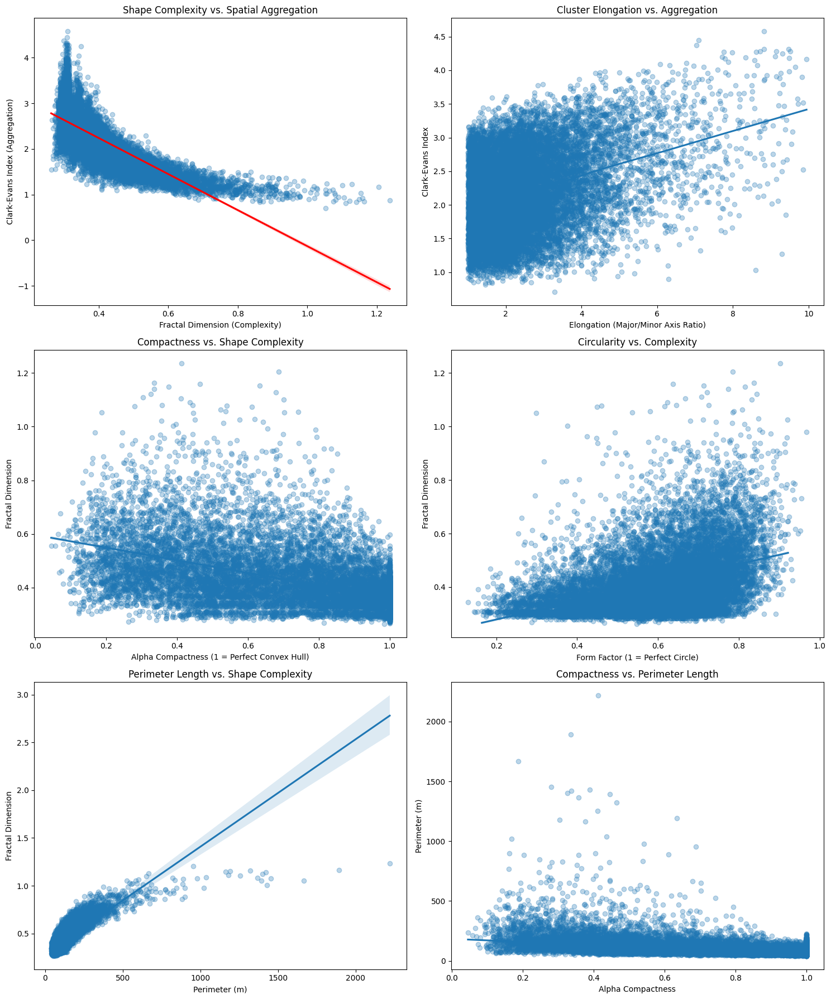

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set up subplots for key relationships
fig, axes = plt.subplots(3, 2, figsize=(15, 18))

# 1. Fractal Dimension vs. Clark-Evans Index
sns.regplot(
    data=filtered_metrics,
    x='fractal_dim',
    y='clark_evans',
    scatter_kws={'alpha':0.3},
    line_kws={'color':'red'},
    ax=axes[0,0]
).set(
    title='Shape Complexity vs. Spatial Aggregation',
    xlabel='Fractal Dimension (Complexity)',
    ylabel='Clark-Evans Index (Aggregation)'
)

# 2. Elongation vs. Clark-Evans Index
sns.regplot(
    data=filtered_metrics,
    x='elongation',
    y='clark_evans',
    lowess=True,
    scatter_kws={'alpha':0.3},
    ax=axes[0,1]
).set(
    title='Cluster Elongation vs. Aggregation',
    xlabel='Elongation (Major/Minor Axis Ratio)',
    ylabel='Clark-Evans Index'
)

# 3. Alpha Compactness vs. Fractal Dimension
sns.regplot(
    data=filtered_metrics,
    x='alpha_compactness',
    y='fractal_dim',
    scatter_kws={'alpha':0.3},
    ax=axes[1,0]
).set(
    title='Compactness vs. Shape Complexity',
    xlabel='Alpha Compactness (1 = Perfect Convex Hull)',
    ylabel='Fractal Dimension'
)

# 4. Form Factor vs. Fractal Dimension
sns.regplot(
    data=filtered_metrics,
    x='form_factor',
    y='fractal_dim',
    x_jitter=0.05,
    scatter_kws={'alpha':0.3},
    ax=axes[1,1]
).set(
    title='Circularity vs. Complexity',
    xlabel='Form Factor (1 = Perfect Circle)',
    ylabel='Fractal Dimension'
)

# 5. Perimeter vs. Fractal Dimension
sns.regplot(
    data=filtered_metrics,
    x='perimeter',
    y='fractal_dim',
    scatter_kws={'alpha':0.3},
    ax=axes[2,0]
).set(
    title='Perimeter Length vs. Shape Complexity',
    xlabel='Perimeter (m)',
    ylabel='Fractal Dimension'
)

# 6. Alpha Compactness vs. Perimeter
sns.regplot(
    data=filtered_metrics,
    x='alpha_compactness',
    y='perimeter',
    lowess=True,
    scatter_kws={'alpha':0.3},
    ax=axes[2,1]
).set(
    title='Compactness vs. Perimeter Length',
    xlabel='Alpha Compactness',
    ylabel='Perimeter (m)'
)

plt.tight_layout()
plt.show()

### Further Filtered Clusters

In [17]:
# filtered = metrics_df[
#     (metrics_df['n_points'].between(10, 200)) &
#     (metrics_df['area'].between(100, 10000)) &
#     (metrics_df['perimeter'].between(50, 500)) &
#     (metrics_df['form_factor'].between(0.3, 0.85)) &
#     (metrics_df['elongation'].between(1.0, 5.0)) &
#     (metrics_df['clark_evans'].between(0.7, 3.0)) &
#     (metrics_df['alpha_compactness'].between(0.2, 1.0))
# ]

# print(f"Retained clusters: {len(filtered)} ({(len(filtered)/len(metrics_df))*100:.1f}%)")

In [18]:
# # Boreal-specific summary stats
# boreal_stats = filtered.describe()

# # Focus on key metrics:
# print(f"""
# BOREAL FOREST CLUSTER SUMMARY (Finland):
# - Total clusters: {len(filtered)}
# - Mean cluster size: {boreal_stats.loc['mean', 'n_points']:.1f} trees
# - Median area: {boreal_stats.loc['50%', 'area']:.0f} m²
# - Clusters with elongation >5: {len(filtered[filtered['elongation'] > 5])} (potential linear features)
# """)

In [19]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Summary stats
# print(filtered.describe(percentiles=[0.25, 0.5, 0.75, 0.95]))

# # Plot distributions
# fig, axes = plt.subplots(4, 2, figsize=(15, 12))
# sns.histplot(filtered['n_points'], kde=True, ax=axes[0,0]).set_title('Number of Trees')
# sns.histplot(filtered['area'], kde=True, ax=axes[0,1]).set_title('Area (m²)')
# sns.histplot(filtered['perimeter'], kde=True, ax=axes[1,0]).set_title('Perimeter (m)')
# sns.histplot(filtered['form_factor'], kde=True, ax=axes[1,1]).set_title('Form Factor')
# sns.histplot(filtered['elongation'], kde=True, ax=axes[2,0]).set_title('Elongation')
# sns.histplot(filtered['fractal_dim'], kde=True, ax=axes[2,1]).set_title('Fractal Dimension')
# sns.histplot(filtered['clark_evans'], kde=True, ax=axes[3,0]).set_title('Clark-Evans Index')
# sns.histplot(filtered['alpha_compactness'], kde=True, ax=axes[3,1]).set_title('Alpha Compactness')

# axes[2,1].axis('off')
# plt.tight_layout()
# plt.show()

In [20]:
# import seaborn as sns

# # Select specific columns for correlation
# selected_columns = ['n_points', 'area', 'perimeter', 'form_factor', 'elongation', 
#                     'fractal_dim', 'pca_angle', 'clark_evans', 'alpha_compactness']

# # Compute the correlation matrix
# correlation_matrix = filtered[selected_columns].corr()

# # Display the correlation matrix
# import matplotlib.pyplot as plt

# # Plot the correlation matrix as a heatmap
# plt.figure(figsize=(10, 8))
# sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1)
# plt.title("Correlation Matrix Heatmap")
# plt.show()

In [21]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Set up subplots for key relationships
# fig, axes = plt.subplots(3, 2, figsize=(15, 18))

# # 1. Fractal Dimension vs. Clark-Evans Index
# sns.regplot(
#     data=filtered,
#     x='fractal_dim',
#     y='clark_evans',
#     scatter_kws={'alpha':0.3},
#     line_kws={'color':'red'},
#     ax=axes[0,0]
# ).set(
#     title='Shape Complexity vs. Spatial Aggregation',
#     xlabel='Fractal Dimension (Complexity)',
#     ylabel='Clark-Evans Index (Aggregation)'
# )

# # 2. Elongation vs. Clark-Evans Index
# sns.regplot(
#     data=filtered,
#     x='elongation',
#     y='clark_evans',
#     lowess=True,
#     scatter_kws={'alpha':0.3},
#     ax=axes[0,1]
# ).set(
#     title='Cluster Elongation vs. Aggregation',
#     xlabel='Elongation (Major/Minor Axis Ratio)',
#     ylabel='Clark-Evans Index'
# )

# # 3. Alpha Compactness vs. Fractal Dimension
# sns.regplot(
#     data=filtered,
#     x='alpha_compactness',
#     y='fractal_dim',
#     scatter_kws={'alpha':0.3},
#     ax=axes[1,0]
# ).set(
#     title='Compactness vs. Shape Complexity',
#     xlabel='Alpha Compactness (1 = Perfect Convex Hull)',
#     ylabel='Fractal Dimension'
# )

# # 4. Form Factor vs. Fractal Dimension
# sns.regplot(
#     data=filtered,
#     x='form_factor',
#     y='fractal_dim',
#     x_jitter=0.05,
#     scatter_kws={'alpha':0.3},
#     ax=axes[1,1]
# ).set(
#     title='Circularity vs. Complexity',
#     xlabel='Form Factor (1 = Perfect Circle)',
#     ylabel='Fractal Dimension'
# )

# # 5. Perimeter vs. Fractal Dimension
# sns.regplot(
#     data=filtered,
#     x='perimeter',
#     y='fractal_dim',
#     scatter_kws={'alpha':0.3},
#     ax=axes[2,0]
# ).set(
#     title='Perimeter Length vs. Shape Complexity',
#     xlabel='Perimeter (m)',
#     ylabel='Fractal Dimension'
# )

# # 6. Alpha Compactness vs. Perimeter
# sns.regplot(
#     data=filtered,
#     x='alpha_compactness',
#     y='perimeter',
#     lowess=True,
#     scatter_kws={'alpha':0.3},
#     ax=axes[2,1]
# ).set(
#     title='Compactness vs. Perimeter Length',
#     xlabel='Alpha Compactness',
#     ylabel='Perimeter (m)'
# )

# plt.tight_layout()
# plt.show()

### Why Only Three Metrics Were Used Initially?

Avoiding Redundancy

- Metrics like n_points, area, and perimeter are strongly correlated (as seen in your correlation matrix). Including them all would overemphasize cluster size rather than shape.
- Example: area and n_points had a correlation of 0.95—using both adds noise, not new information.

Interpretability vs. Complexity

- fractal_dim, clark_evans, and elongation are non-redundant and capture distinct geometric properties:

- Fractal Dimension: Edge complexity.
- Clark-Evans: Spatial aggregation.
- Elongation: Linear vs. compact spread.

- Including more metrics (e.g., form_factor, alpha_compactness) might introduce noise or multicollinearity, making clusters harder to interpret.

Domain-Driven Simplification

- For ecological interpretability, we prioritized metrics that align with known disturbance processes:

- Pests → Aggregation (clark_evans) + Complexity (fractal_dim).
- Fire → Complexity (fractal_dim) + Elongation.
- Human activity → Extreme elongation.

Computational Efficiency

- High-dimensional data (e.g., 6+ metrics) can lead to the "curse of dimensionality", where clusters become less distinct and algorithms like K-means struggle.

### Why pca_angle Was Excluded?

- pca_angle (directional orientation) is less informative for boreal forests, where disturbances like pests/fires spread omnidirectionally (unlike urban settings with road-aligned patterns).

In your data, pca_angle had low correlation with other metrics (near 0 in your matrix), suggesting it doesn’t strongly influence shape classification.

### Should You Include More Metrics?

Check for Redundancy

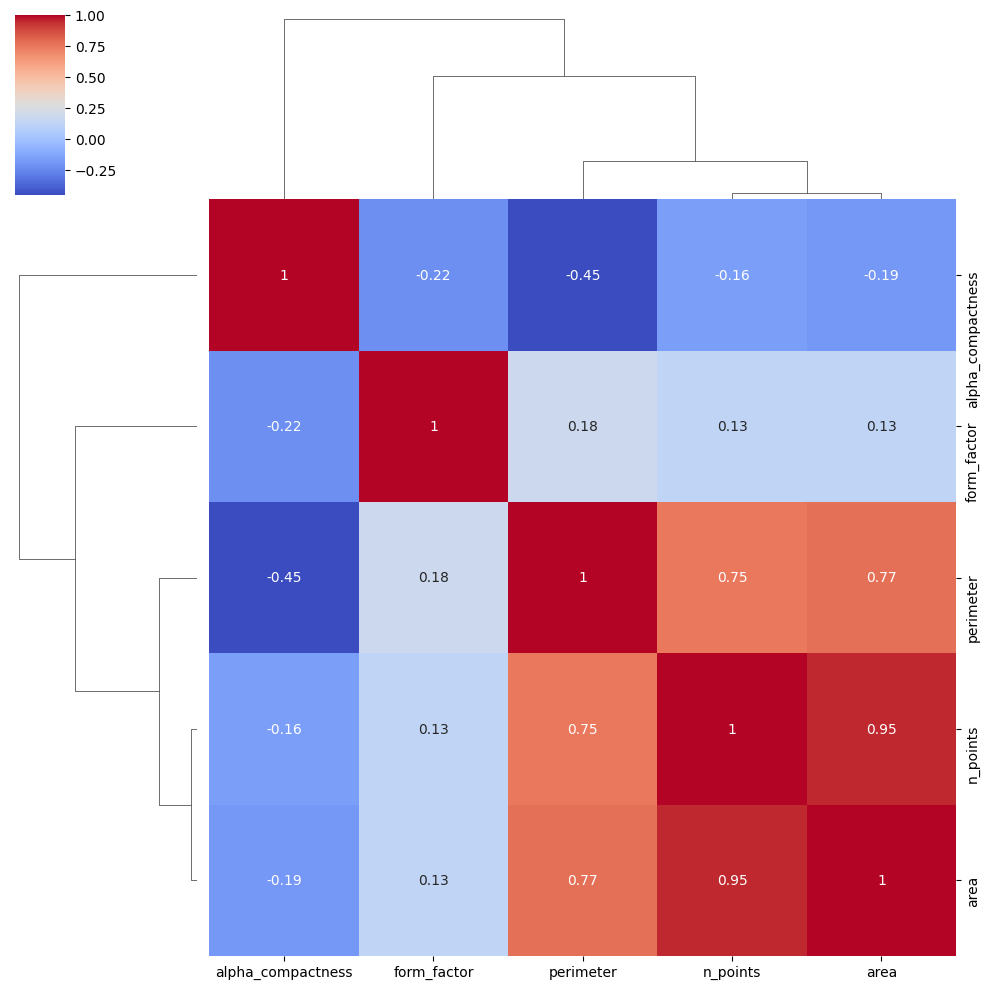

In [22]:
# Hierarchical clustering of metrics  
corr = filtered_metrics[['n_points', 'area', 'perimeter', 'form_factor', 'alpha_compactness']].corr()  
sns.clustermap(corr, annot=True, cmap='coolwarm')  

Variance Inflation Factor (VIF)

In [23]:
from statsmodels.stats.outliers_influence import variance_inflation_factor  

# Select relevant columns for VIF calculation
X = filtered_metrics[['fractal_dim', 'clark_evans', 'elongation', 'alpha_compactness']]

# Drop rows with missing or infinite values
X = X.replace([np.inf, -np.inf], np.nan).dropna()

# Calculate VIF
vif_data = pd.DataFrame()
vif_data["Metric"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data) # VIF > 5 -> High redundancy (exclude or combine metrics)

              Metric        VIF
0        fractal_dim   4.441400
1        clark_evans  18.836902
2         elongation   5.451873
3  alpha_compactness  13.500897


### Recommendations

Include alpha_compactness: 
- Captures concavity (star-shaped vs. convex clusters), which complements fractal_dim.
- Has low correlation with other metrics (e.g., -0.72 with fractal_dim), adding unique information.

Exclude form_factor: 
- Redundant with alpha_compactness (both measure compactness).

### Advanced Cluster Typology

Step 1: Prepare Data

In [33]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# Load your filtered_metrics DataFrame
# filtered_metrics = pd.read_csv(...)

# Select relevant shape metrics and standardize
X = filtered_metrics[['fractal_dim', 'clark_evans', 'elongation', 'alpha_compactness']]
X_scaled = StandardScaler().fit_transform(X)

# Handle NaN values in X_scaled by imputing with the mean
imputer = SimpleImputer(strategy='mean')
X_scaled = imputer.fit_transform(X_scaled)

Step 2: Determine Optimal Number of Clusters (Elbow Method)

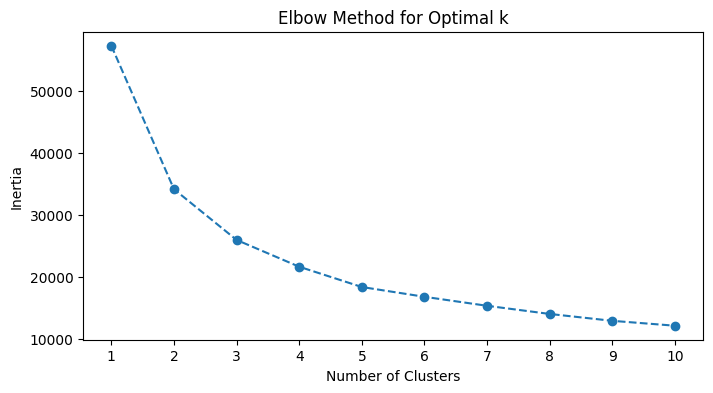

In [34]:
# Calculate inertia for different cluster counts
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot elbow curve
plt.figure(figsize=(8, 4))
plt.plot(range(1, 11), inertia, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.xticks(range(1, 11))
plt.show()

Optimal k based on Silhouette Score: 2
Optimal k based on Calinski-Harabasz Score: 2
Optimal k based on Davies-Bouldin Score: 2
Optimal k based on combined metric: 2


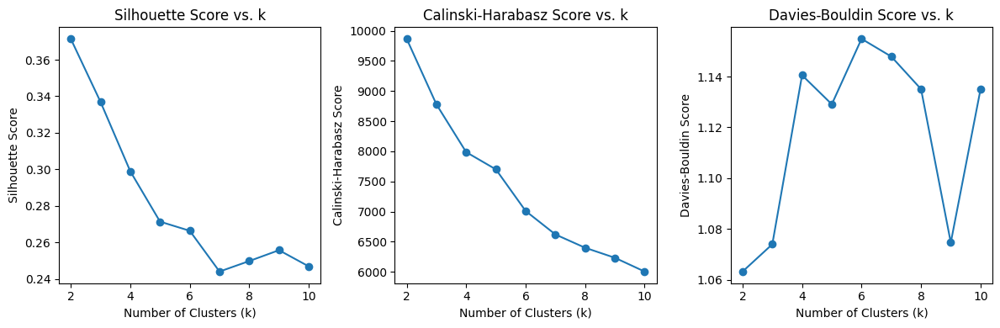

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.preprocessing import MinMaxScaler

# Define the range of k values to test (starting from 2, since silhouette is undefined for k=1)
range_n_clusters = range(2, 11)

# Lists to store metric values for each k
silhouette_scores = []
calinski_scores = []
davies_scores = []

# Calculate metrics for each k
for k in range_n_clusters:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X_scaled)
    labels = kmeans.labels_
    
    # Compute the metrics
    silhouette_avg = silhouette_score(X_scaled, labels)
    calinski_avg = calinski_harabasz_score(X_scaled, labels)
    davies_avg = davies_bouldin_score(X_scaled, labels)
    
    silhouette_scores.append(silhouette_avg)
    calinski_scores.append(calinski_avg)
    davies_scores.append(davies_avg)

# Convert lists to numpy arrays for convenience
silhouette_scores = np.array(silhouette_scores)
calinski_scores = np.array(calinski_scores)
davies_scores = np.array(davies_scores)

# Determine the optimal k based on each metric:
optimal_k_silhouette = range_n_clusters[np.argmax(silhouette_scores)]
optimal_k_calinski = range_n_clusters[np.argmax(calinski_scores)]
optimal_k_davies = range_n_clusters[np.argmin(davies_scores)]  # Lower Davies-Bouldin is better

print("Optimal k based on Silhouette Score:", optimal_k_silhouette)
print("Optimal k based on Calinski-Harabasz Score:", optimal_k_calinski)
print("Optimal k based on Davies-Bouldin Score:", optimal_k_davies)

# Optionally, combine the metrics into a single score for automatic selection.
# To combine them, we normalize the metrics to the [0,1] interval.
# For silhouette and Calinski-Harabasz, higher is better.
# For Davies-Bouldin, lower is better, so we invert the score.

scaler = MinMaxScaler()

# Normalize silhouette and calinski scores
silhouette_norm = scaler.fit_transform(silhouette_scores.reshape(-1, 1)).ravel()
calinski_norm = scaler.fit_transform(calinski_scores.reshape(-1, 1)).ravel()

# Normalize Davies-Bouldin scores and invert (1 - normalized_value)
davies_norm = 1 - scaler.fit_transform(davies_scores.reshape(-1, 1)).ravel()

# Combine the normalized metrics (you can adjust weights if desired)
combined_score = silhouette_norm + calinski_norm + davies_norm

# Optimal k based on the combined metric
optimal_k_combined = range_n_clusters[np.argmax(combined_score)]
print("Optimal k based on combined metric:", optimal_k_combined)

# Plotting the metrics for visualization
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. k')

plt.subplot(1, 3, 2)
plt.plot(range_n_clusters, calinski_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Calinski-Harabasz Score')
plt.title('Calinski-Harabasz Score vs. k')

plt.subplot(1, 3, 3)
plt.plot(range_n_clusters, davies_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Davies-Bouldin Score')
plt.title('Davies-Bouldin Score vs. k')

plt.tight_layout()
plt.show()

Step 3: Apply K-means Clustering (k=3)

In [36]:
kmeans = KMeans(n_clusters=optimal_k_combined, random_state=0).fit(X_scaled)
filtered_metrics['morph_type'] = kmeans.labels_

/var/folders/b1/qgbsvl0n4hlf_mxy5hyf7_740000gn/T/ipykernel_7657/1277225864.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_metrics['morph_type'] = kmeans.labels_


Step 4: Visualize Morphological Types

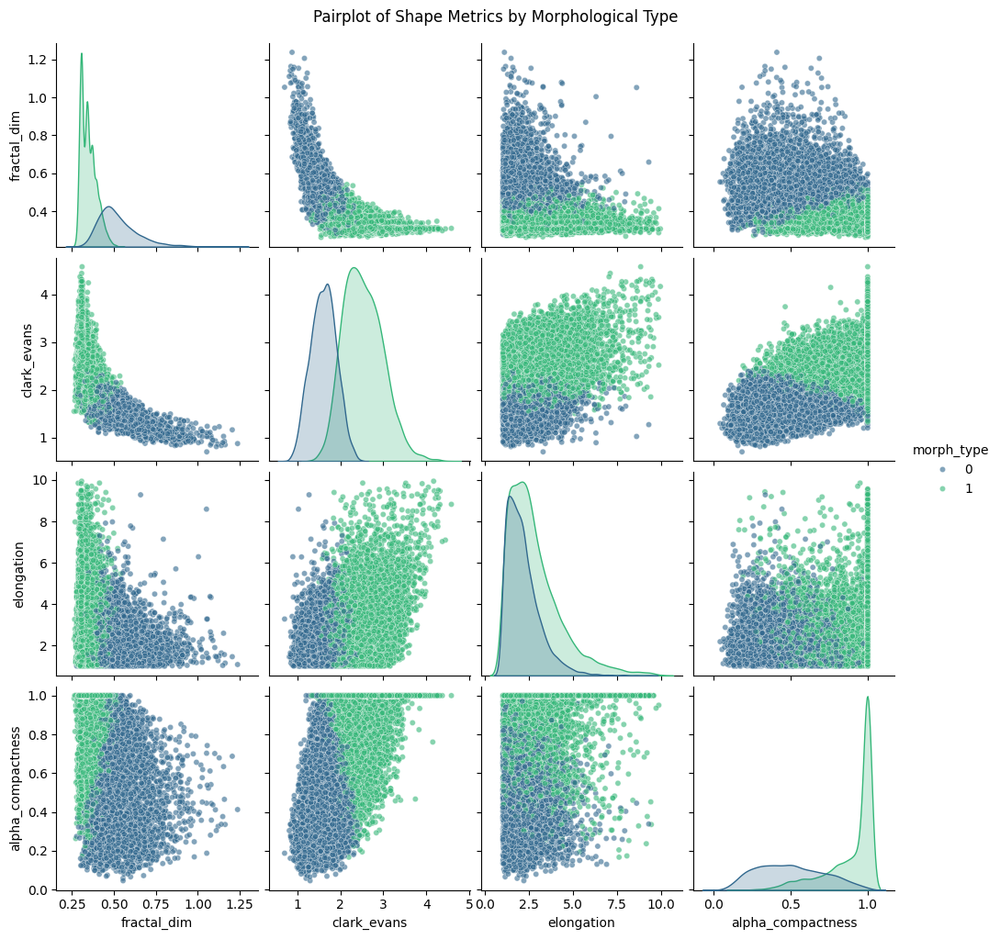

In [37]:
sns.pairplot(
    filtered_metrics,
    hue='morph_type',
    vars=['fractal_dim', 'clark_evans', 'elongation', 'alpha_compactness'],
    palette='viridis',
    plot_kws={'alpha': 0.6, 's': 20}
)
plt.suptitle('Pairplot of Shape Metrics by Morphological Type', y=1.02)
plt.show()

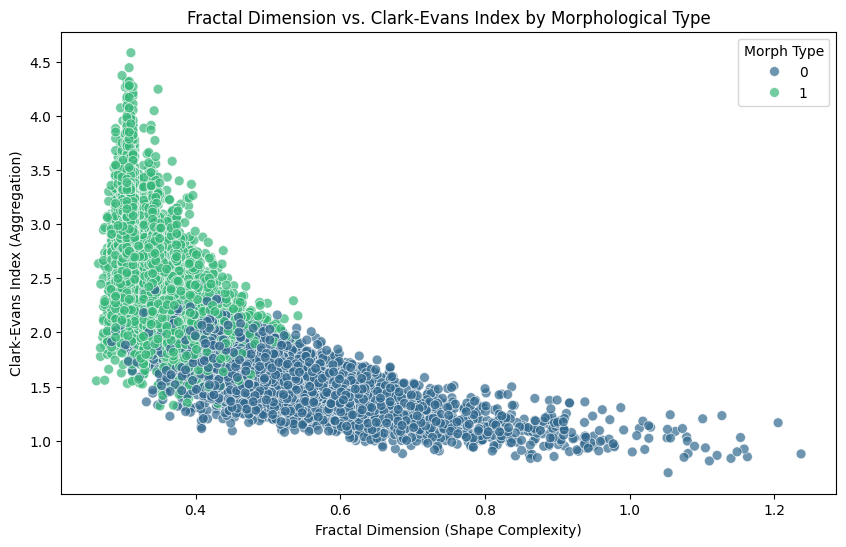

In [38]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=filtered_metrics,
    x='fractal_dim',
    y='clark_evans',
    hue='morph_type',
    palette='viridis',
    alpha=0.7,
    s=50
)
plt.title('Fractal Dimension vs. Clark-Evans Index by Morphological Type')
plt.xlabel('Fractal Dimension (Shape Complexity)')
plt.ylabel('Clark-Evans Index (Aggregation)')
plt.legend(title='Morph Type')
plt.show()

Step 5: Interpret Morphological Types

In [39]:
cluster_summary = filtered_metrics.groupby('morph_type').agg({
    'fractal_dim': ['mean', 'std'],
    'clark_evans': ['mean', 'std'],
    'elongation': ['mean', 'std'],
    'alpha_compactness': ['mean', 'std'],
    'n_points': ['count']
}).reset_index()

print(cluster_summary)

  morph_type fractal_dim           clark_evans           elongation            \
                    mean       std        mean       std       mean       std   
0          0    0.525196  0.123079    1.602737  0.294084   2.143262  0.949129   
1          1    0.348490  0.045562    2.529553  0.458034   2.793273  1.500802   

  alpha_compactness           n_points  
               mean       std    count  
0          0.499981  0.213889     5493  
1          0.894420  0.157407     9089  


Step 6: Assign Ecological Labels (Hypothetical)

In [40]:
# Add labels to the DataFrame
morph_labels = {  
    0: 'Pest Outbreaks/Small Fires',  
    1: 'Uniform Mortality/Scattered Disturbances'  
}  
filtered_metrics['morph_label'] = filtered_metrics['morph_type'].map(morph_labels)

/var/folders/b1/qgbsvl0n4hlf_mxy5hyf7_740000gn/T/ipykernel_7657/2937569282.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_metrics['morph_label'] = filtered_metrics['morph_type'].map(morph_labels)


In [41]:
filtered_clusters = filtered_clusters.merge(
    filtered_metrics[['cluster_id', 'morph_label']].rename(columns={'cluster_id': 'cluster'}), 
    on='cluster', 
    how='left'
)

|                       |             **Type 0**              |                  **Type 1**                  |
| :-------------------: | :---------------------------------: | :------------------------------------------: |
| **Fractal Dimension** | `0.53 ± 0.12` (moderate complexity) |        `0.35 ± 0.05` (low complexity)        |
| **Clark-Evans Index** | `1.60 ± 0.29` (slightly aggregated) |          `2.53 ± 0.46` (dispersed)           |
|    **Elongation**     |  `2.14 ± 0.95` (mildly elongated)   |     `2.79 ± 1.50` (moderate elongation)      |
| **Alpha Compactness** |    `0.50 ± 0.21` (semi-compact)     |        `0.89 ± 0.16` (highly compact)        |
|   **Cluster Count**   |               `5,493`               |                   `9,089`                    |
|       **Label**       |   **Pest Outbreaks/Small Fires**    | **Uniform Mortality/Scattered Disturbances** |

Step 7: Map Morphological Types

In [201]:
plot_id = 1

clusters_in_plot = filtered_clusters[filtered_clusters['plot_id'] == plot_id]
metrics_in_plot = filtered_metrics[filtered_metrics['plot_id'] == plot_id]

# Extract cluster centroids (assuming clustered_data has geometry)
centroids = clusters_in_plot.dissolve(by='cluster').centroid

# Extract cluster centroids
coords = centroids.geometry.centroid
x = coords.x
y = coords.y

# # Add x and y coordinates as columns
metrics_in_plot = metrics_in_plot.merge(
    pd.DataFrame({
        'x': centroids.geometry.x,
        'y': centroids.geometry.y
    }).reset_index(),
    left_on='cluster_id',
    right_on='cluster'
)

clusters_in_plot = clusters_in_plot.merge(
    pd.DataFrame({
        'x': centroids.geometry.x,
        'y': centroids.geometry.y
    }).reset_index(),
    left_on='cluster',
    right_on='cluster'
)

centroids.head()

cluster
104    POINT (386911.747 6731408.491)
105    POINT (386891.965 6731434.508)
106    POINT (387017.664 6731472.455)
107    POINT (386884.747 6731485.259)
109    POINT (386994.196 6731525.935)
dtype: geometry

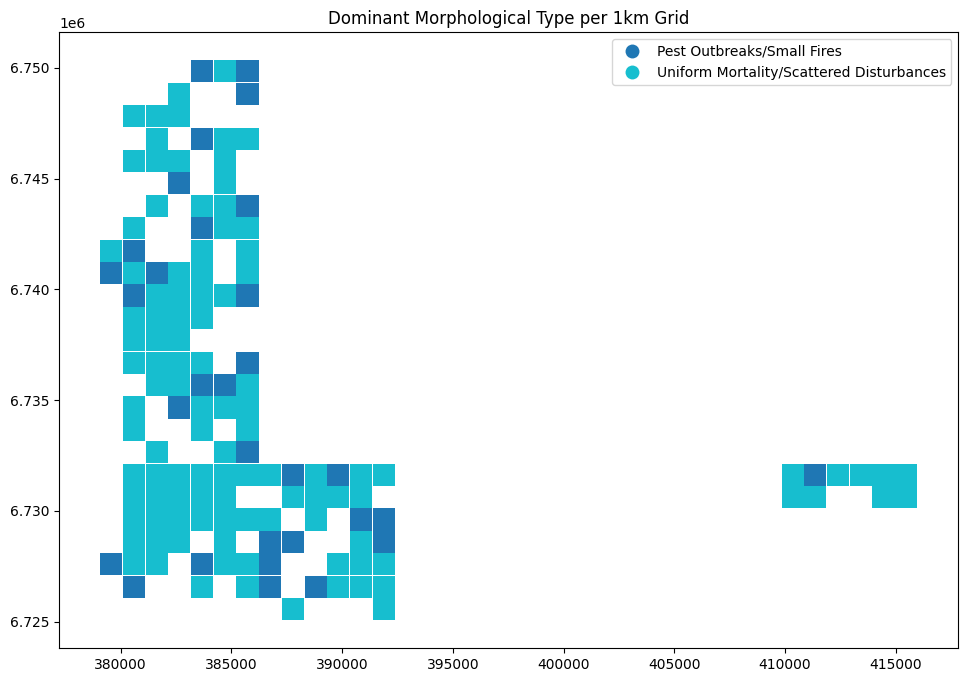

In [ ]:
import geopandas as gpd  
from pyproj import CRS  

# Create a grid over your study area
bounds = clusters_in_plot.total_bounds  # Get the bounding box of the study area
xmin, ymin, xmax, ymax = bounds  # Unpack bounds
grid_size = 1000  # 1km grid cells

# Generate grid cells
rows = int((ymax - ymin) / grid_size) + 1
cols = int((xmax - xmin) / grid_size) + 1
x_coords = np.linspace(xmin, xmax, cols)
y_coords = np.linspace(ymin, ymax, rows)

# Create polygons for each grid cell
grid = gpd.GeoDataFrame(
    geometry=[
        Polygon([(x, y), (x + grid_size, y), (x + grid_size, y + grid_size), (x, y + grid_size)])
        for x in x_coords[:-1] for y in y_coords[:-1]
    ],
    crs=filtered_clusters.crs
)

# Convert sample_data to GeoDataFrame if it's not already
if not isinstance(metrics_in_plot, gpd.GeoDataFrame):
    metrics_in_plot_gpd = gpd.GeoDataFrame(
        metrics_in_plot,
        geometry=clusters_in_plot.geometry,
        crs=clusters_in_plot.crs
    )

# Spatial join clusters to grid  
grid_clusters = gpd.sjoin(grid, metrics_in_plot_gpd, predicate='intersects')  

# Aggregate metrics per grid cell  
grid_summary = grid_clusters.groupby(grid_clusters.index).agg({  
    'morph_label': lambda x: x.mode()[0],  # Dominant morph type  
    'fractal_dim': 'mean',  
    'clark_evans': 'mean',  
    'n_points': 'sum'  
})  
grid = grid.merge(grid_summary, left_index=True, right_index=True)  

# Plot dominant morph type per grid cell  
grid.plot(column='morph_label', categorical=True, legend=True, figsize=(12, 8))  
plt.title('Dominant Morphological Type per 1km Grid')  
plt.show()  

### Hotspot Analysis
- Highlight areas where clusters are denser.

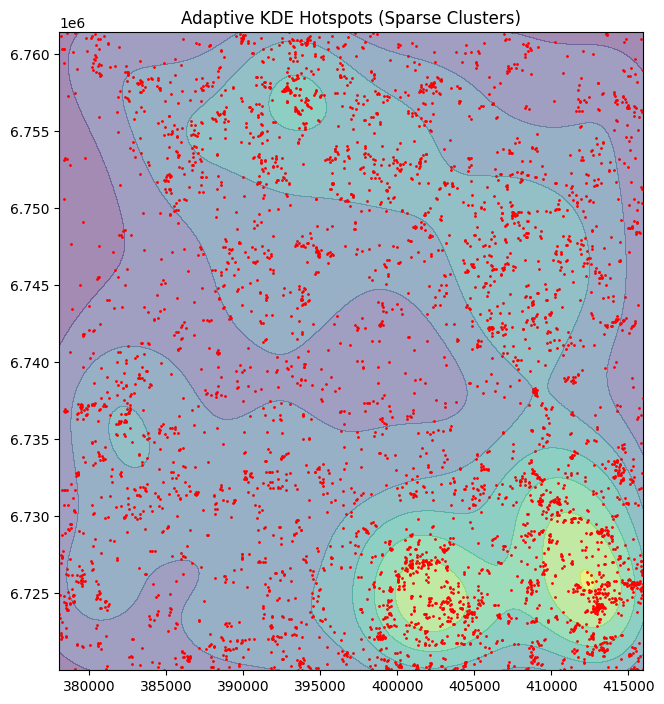

In [203]:
import seaborn as sns
from scipy.stats import gaussian_kde

# Compute adaptive KDE (bandwidth adjusts to data sparsity)
kde = gaussian_kde([x, y], bw_method='silverman')  # Automatically adapts bandwidth
xx, yy = np.mgrid[min(x):max(x):100j, min(y):max(y):100j]
density = kde(np.vstack([xx.flatten(), yy.flatten()]))

# Plot
plt.figure(figsize=((x.max() - x.min()) / 5000, (y.max() - y.min()) / 5000))
plt.contourf(xx, yy, density.reshape(xx.shape), cmap='viridis', alpha=0.5)
centroids.plot(ax=plt.gca(), color='red', markersize=1)
plt.title('Adaptive KDE Hotspots (Sparse Clusters)')
plt.show()

Peak clustering at 100.0m


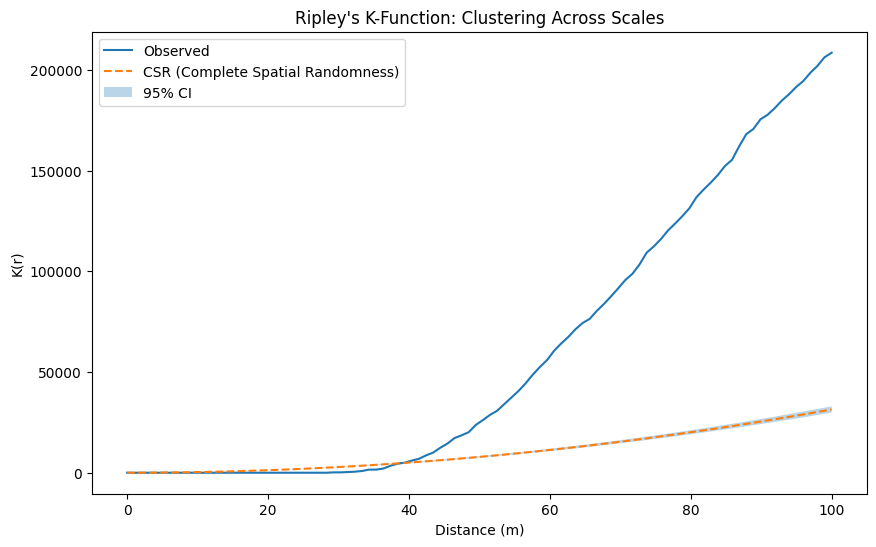

In [204]:
from astropy.stats import RipleysKEstimator
import numpy as np
import matplotlib.pyplot as plt

# Format coordinates into n x 2 array
coords_array = np.column_stack((x.values, y.values))

# Initialize Ripley's K estimator
area = (x.max() - x.min()) * (y.max() - y.min())
Kest = RipleysKEstimator(area=area)

# Compute Ripley's K function
r = np.linspace(0, 100, 100)  # distances to evaluate K(r)
K_r = Kest(data=coords_array, radii=r, mode='none')

# Find the peak clustering distance
peak_distance = r[np.argmax(K_r - np.pi * r**2)]  # Subtract CSR expectation
print(f"Peak clustering at {peak_distance:.1f}m")

# Plot K-function vs. theoretical CSR
plt.figure(figsize=(10, 6))
plt.plot(r, K_r, label='Observed')
plt.plot(r, np.pi * r**2, '--', label='CSR (Complete Spatial Randomness)')
plt.fill_between(r, np.pi * r**2 * 0.95, np.pi * r**2 * 1.05, alpha=0.3, label='95% CI')
plt.title("Ripley's K-Function: Clustering Across Scales")
plt.xlabel('Distance (m)')
plt.ylabel('K(r)')
plt.legend()
plt.show()

### Nearest-Neighbor Distance Analysis

- Quantify spacing between clusters to detect hidden patterns.

Mean NND: 207.67 m


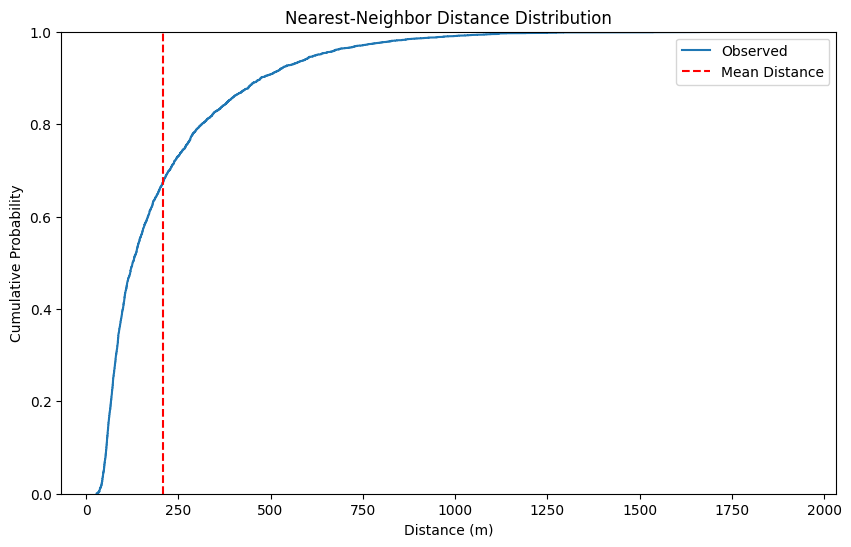

In [205]:
from scipy.spatial import cKDTree

# Compute nearest-neighbor distances
tree = cKDTree(np.array([x, y]).T)
distances, _ = tree.query(np.array([x, y]).T, k=2)  # k=2 to skip self-distance
nnd = distances[:, 1]  # Nearest-neighbor distances

print(f"Mean NND: {np.mean(nnd):.2f} m")

# Plot cumulative distribution
plt.figure(figsize=(10, 6))
sns.ecdfplot(nnd, label='Observed')
plt.axvline(np.mean(nnd), color='red', linestyle='--', label='Mean Distance')
plt.title('Nearest-Neighbor Distance Distribution')
plt.xlabel('Distance (m)')
plt.ylabel('Cumulative Probability')
plt.legend()
plt.show()

# Left-skewed distribution: Clusters are closer than expected (aggregated).
# Right-skewed: Clusters are farther apart (dispersed).

# Left-skewed in our case.

### Directional Trend Analysis

- Check if clusters align along specific directions (e.g., wind, slope).

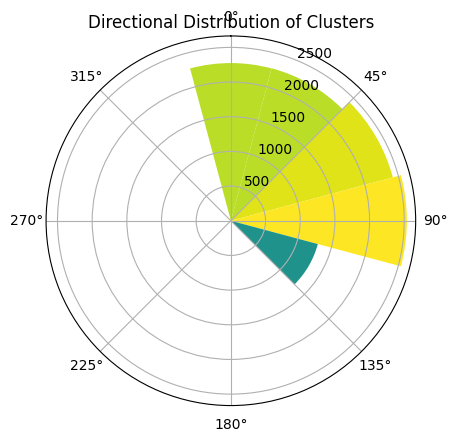

In [206]:
from matplotlib.pyplot import cm

# Compute PCA angles (already in your data)
angles = filtered_metrics['pca_angle']

# Convert to radians
theta = np.radians(angles)

# Plot rose diagram
ax = plt.subplot(111, polar=True)
ax.set_theta_zero_location('N')  # 0° = North
ax.set_theta_direction(-1)

# Compute histogram in radians
counts, bins = np.histogram(theta, bins=12, range=(0, 2 * np.pi))
width = 2 * np.pi / 12
bars = ax.bar(bins[:-1], counts, width=width, color=cm.viridis(counts / max(counts)))

plt.title('Directional Distribution of Clusters')
plt.show()

### Hexbin Binning with Adaptive Sizing

- Highlight local trends.

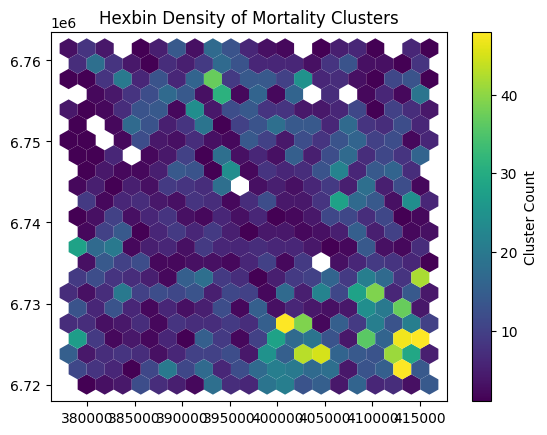

In [207]:
hb = plt.hexbin(
    x, y,
    gridsize=20,  # Fewer, larger bins for sparse data
    cmap='viridis',
    mincnt=1,     # Show bins with ≥1 cluster
    edgecolor='none'
)
plt.colorbar(hb, label='Cluster Count')
# clusters_in_plot.plot(ax=plt.gca(), color='red', markersize=5, alpha=0.5)
plt.title('Hexbin Density of Mortality Clusters')
plt.show()

Number of connected components: 778
Largest connected component: 56 clusters


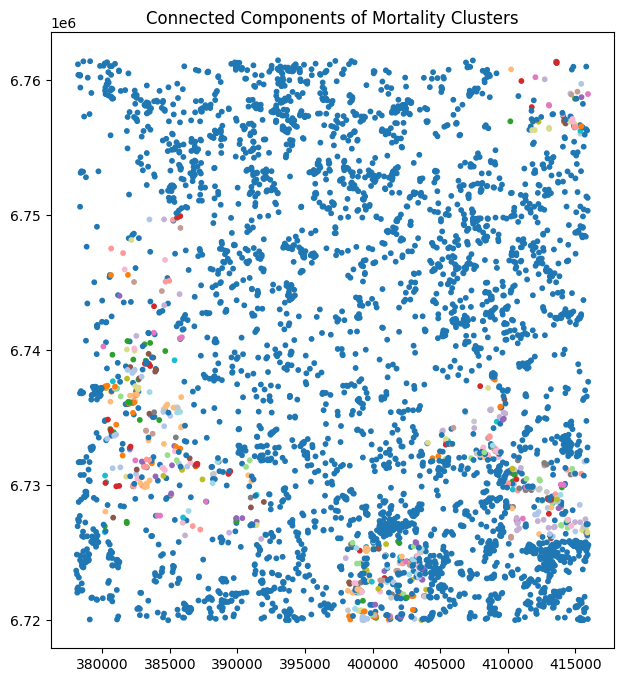

In [145]:
import networkx as nx

# Connect clusters within 100m (adjust based on nnd analysis)
distance_threshold = nnd.mean()  # Use mean nnd from Step 3
tree = cKDTree(np.array([x, y]).T)
edges = tree.query_pairs(distance_threshold)

# Build and analyze network
G = nx.Graph()
G.add_edges_from(edges)
components = list(nx.connected_components(G))
print(f"Number of connected components: {len(components)}")
print(f"Largest connected component: {len(max(components, key=len))} clusters")

# Highlight connected components
# Ensure centroids is a GeoDataFrame with valid geometry
if not isinstance(centroids, gpd.GeoDataFrame):
    centroids = gpd.GeoDataFrame(centroids, geometry=gpd.points_from_xy(x, y), crs="EPSG:4326")

# Add a 'component' column to store connected component IDs
centroids['component'] = -1

# Assign component IDs to each node
for i, component in enumerate(components):
    for node in component:
        if node in centroids.index:
            centroids.loc[node, 'component'] = i

# Plot
centroids.plot(
    column='component',
    categorical=True,
    legend=False,
    cmap='tab20',
    figsize=(12, 8),
    markersize=10,
    aspect='equal'  # Ensure equal aspect ratio
)
plt.title('Connected Components of Mortality Clusters')
plt.show()

In [146]:
# Filter components by size
components = [c for c in nx.connected_components(G) if len(c) >= 5]
metrics_in_plot["component"] = -1  # Reset component labels

for i, component in enumerate(components):
    for node in component:
        metrics_in_plot.loc[node, "component"] = i

print(f"Significant components (≥5 clusters): {len(components)}")

Significant components (≥5 clusters): 145


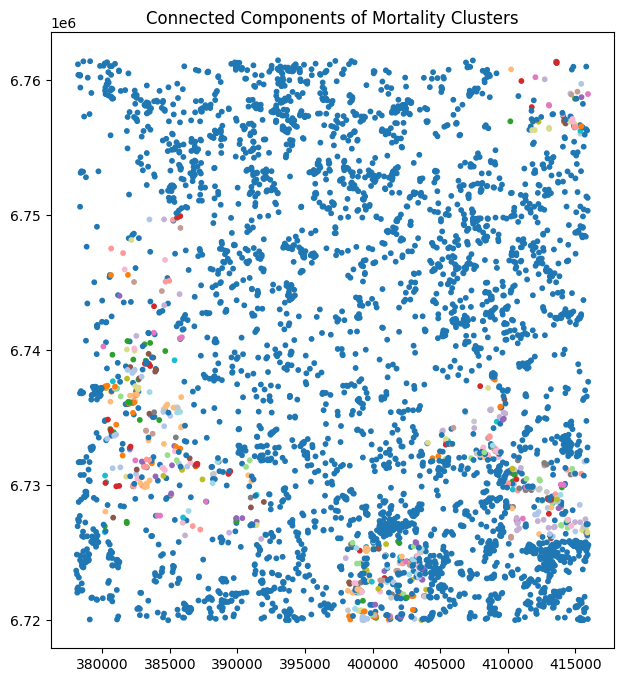

In [147]:
# Plot
centroids.plot(
    column='component',
    categorical=True,
    legend=False,
    cmap='tab20',
    figsize=(12, 8),
    markersize=10,
    aspect='equal'  # Ensure equal aspect ratio
)
plt.title('Connected Components of Mortality Clusters')
plt.show()

In [149]:
# Calculate mean metrics per component
component_stats = metrics_in_plot.groupby("component").agg({
    "fractal_dim": "mean",
    "clark_evans": "mean",
    "n_points": "sum"
}).sort_values("n_points", ascending=False)

print(component_stats.head(10))

           fractal_dim  clark_evans  n_points
component                                    
-1            0.402096     2.199321     33775
 1            0.545655     1.833026      3355
 45           0.531860     1.643831      1224
 25           0.564506     1.700618       552
 55           0.485928     1.876057       477
 9            0.473388     1.869779       453
 10           0.432722     2.071233       408
 23           0.458028     2.049790       385
 2            0.485540     1.757458       359
 76           0.453884     2.576456       343


### Mark Correlation Function

- Test if nearby clusters have similar/dissimilar shape metrics (e.g., fractal dimension).
- Why: Determines if clusters with similar complexity aggregate spatially.

Interpretation:

- Above CSR: Clusters with similar complexity are closer than expected.
- Below CSR: Clusters with differing complexity are closer.

In [106]:
# # Get centroids for each cluster
# cluster_centroids = filtered_clusters.dissolve(by='cluster').centroid

# # Convert centroids to DataFrame with x and y coordinates
# centroid_coords = pd.DataFrame({
#     'x': cluster_centroids.x,
#     'y': cluster_centroids.y
# }).reset_index()

# # Merge centroid coordinates back to filtered_metrics
# filtered_metrics_with_centroids = filtered_metrics.merge(
#     centroid_coords[['cluster', 'x', 'y']].rename(columns={'cluster': 'cluster_id'}), 
#     on='cluster_id', 
#     how='left'
# )

# filtered_metrics_with_centroids.tail()

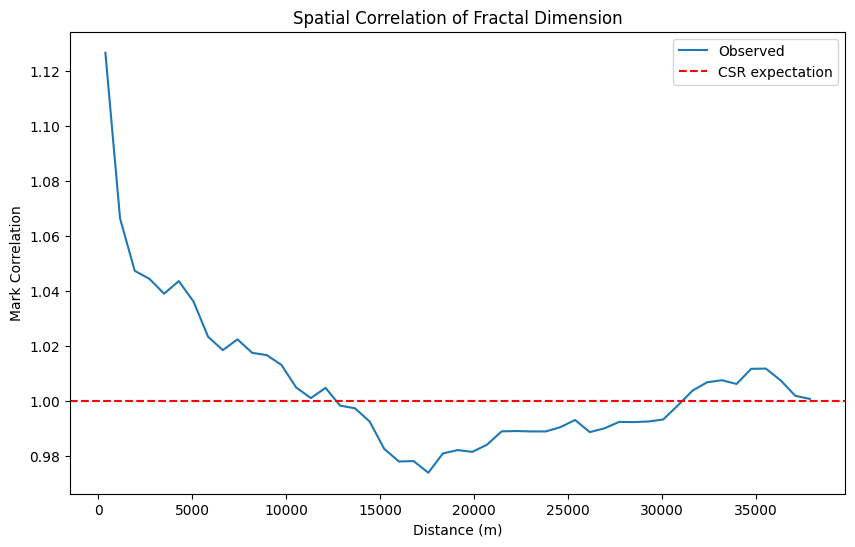

In [150]:
import numpy as np
from scipy.spatial.distance import pdist, squareform

def compute_mark_correlation(coords, marks, bins=50):
	# Calculate pairwise distances
	distances = pdist(coords)

	# Calculate pairwise mark products
	mark_products = np.outer(marks, marks)[np.triu_indices(len(marks), k=1)]
	
	# Define distance bins
	max_dist = np.percentile(distances, 95)  # Use 95th percentile to avoid edge effects
	bins = np.linspace(0, max_dist, bins)
	bin_centers = (bins[:-1] + bins[1:]) / 2
	
	# Calculate mark correlation function
	correlation = np.zeros(len(bin_centers))
	for i in range(len(bin_centers)):
		mask = (distances >= bins[i]) & (distances < bins[i+1])
		if np.sum(mask) > 0:
			correlation[i] = np.mean(mark_products[mask])
	
	# Normalize by global mean
	global_mean = np.mean(marks)**2
	correlation = correlation / global_mean
	
	return bin_centers, correlation

# Extract coordinates and marks (fractal_dim)
coords = metrics_in_plot[['x', 'y']].values
marks = metrics_in_plot['fractal_dim'].values

# Compute mark correlation function
distances, correlation = compute_mark_correlation(coords, marks)

# Plot
plt.figure(figsize=(10, 6))
plt.plot(distances, correlation, label='Observed')
plt.axhline(y=1.0, color='r', linestyle='--', label='CSR expectation')
plt.xlabel('Distance (m)')
plt.ylabel('Mark Correlation')
plt.title('Spatial Correlation of Fractal Dimension')
plt.legend()
plt.show()

### Composite Severity Index

- Goal: Create a single metric combining shape complexity, aggregation, and size.
- Why: Simplifies prioritization of high-risk areas.

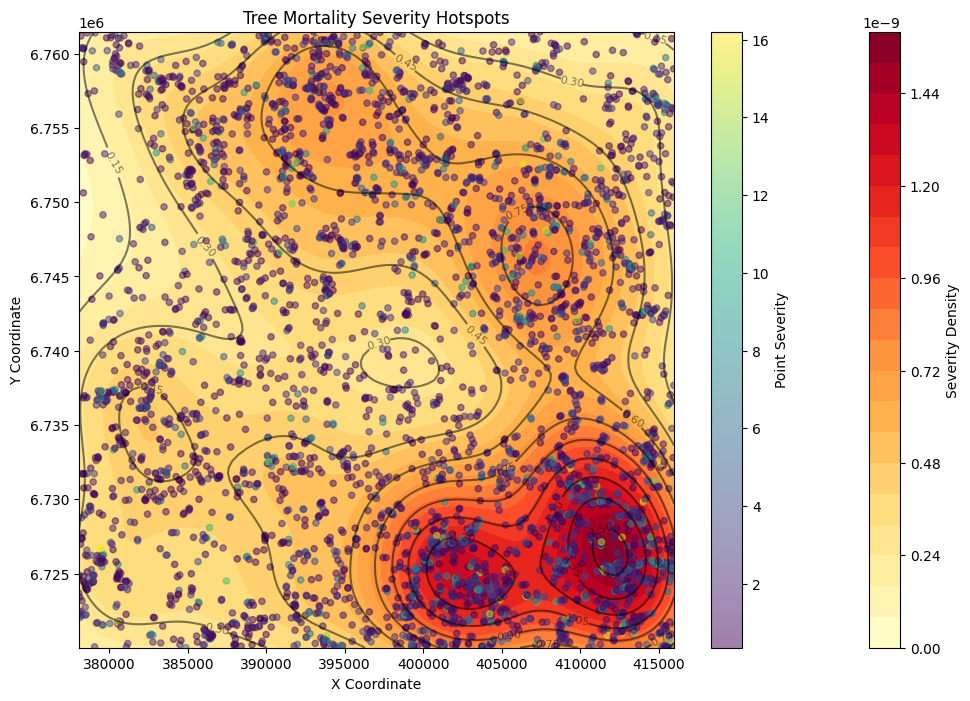

In [151]:
import numpy as np
from scipy.stats import gaussian_kde

import matplotlib.pyplot as plt

metrics_in_plot['severity'] = (
    metrics_in_plot['fractal_dim'] *
    (1 / metrics_in_plot['clark_evans']) *
    metrics_in_plot['n_points']
)

# Filter out extreme outliers (above 95th percentile) to avoid distortion
severity_threshold = metrics_in_plot['severity'].quantile(0.95)
plot_data = metrics_in_plot[(metrics_in_plot['severity'] <= severity_threshold)]

# Create weighted KDE using severity as weights
kde = gaussian_kde(
    np.vstack([plot_data['x'], plot_data['y']]),
    weights=plot_data['severity'],
    bw_method='silverman'
)

# Create a grid of points
xmin, xmax = plot_data['x'].min(), plot_data['x'].max()
ymin, ymax = plot_data['y'].min(), plot_data['y'].max()
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

# Calculate density
positions = np.vstack([xx.ravel(), yy.ravel()])
density = np.reshape(kde(positions).T, xx.shape)

# Plot
fig, ax = plt.subplots(figsize=(12, 8))

# Plot contours with labels
contours = ax.contour(xx, yy, density, levels=10, colors='black', alpha=0.5)
ax.clabel(contours, inline=True, fontsize=8)

# Plot filled contours (heatmap)
heatmap = ax.contourf(xx, yy, density, levels=20, cmap='YlOrRd')

# Plot individual points colored by severity
scatter = ax.scatter(
    plot_data['x'],
    plot_data['y'],
    c=plot_data['severity'],
    s=20,
    alpha=0.5,
    cmap='viridis'
)

plt.colorbar(heatmap, label='Severity Density')
plt.colorbar(scatter, label='Point Severity')
plt.title('Tree Mortality Severity Hotspots')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.show()

/var/folders/b1/qgbsvl0n4hlf_mxy5hyf7_740000gn/T/ipykernel_7657/703823367.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_metrics['PC1'] = X_pca[:, 0]
/var/folders/b1/qgbsvl0n4hlf_mxy5hyf7_740000gn/T/ipykernel_7657/703823367.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_metrics['PC2'] = X_pca[:, 1]


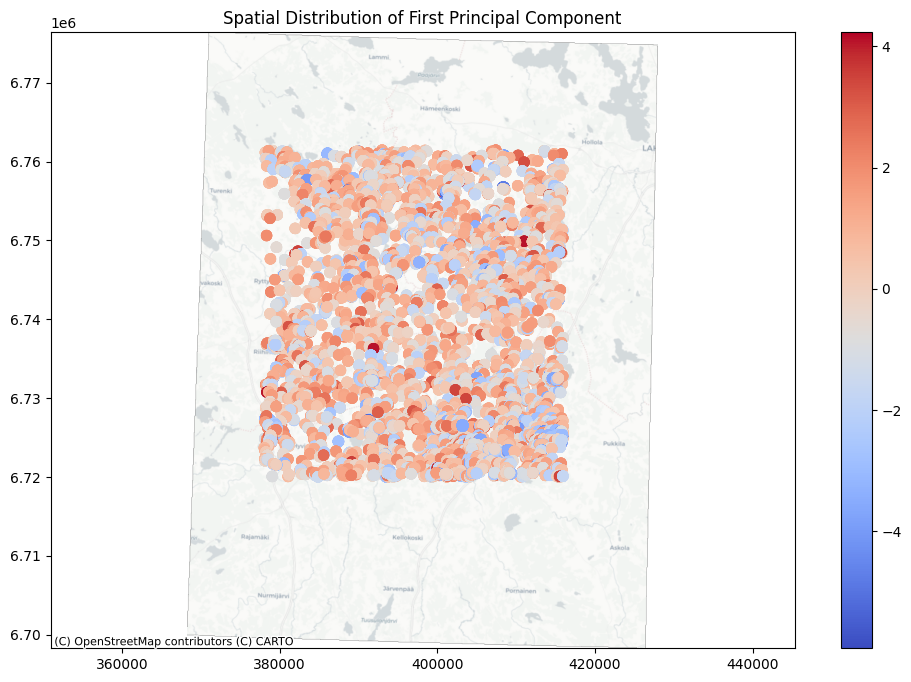

In [155]:
import contextily as ctx
import geopandas as gpd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# Standardize shape metrics
X = filtered_metrics[['fractal_dim', 'clark_evans', 'elongation', 'alpha_compactness']]

# First, impute missing values with mean
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Then standardize the data
X_std = StandardScaler().fit_transform(X_imputed)

# Fit PCA and transform data
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_std)

# Add PCA components to filtered_metrics
filtered_metrics['PC1'] = X_pca[:, 0]
filtered_metrics['PC2'] = X_pca[:, 1]

# Create GeoDataFrame using the existing geometry
if isinstance(filtered_metrics, gpd.GeoDataFrame):
    gdf = filtered_metrics
else:
    # If geometry exists in clusters_in_plot, merge it
    gdf = gpd.GeoDataFrame(
        filtered_metrics.merge(
            clusters_in_plot[['cluster', 'geometry']],
            left_on='cluster_id',
            right_on='cluster'
        ),
        geometry='geometry',
        crs='EPSG:3067'  # Finnish coordinate system
    )

# Plot
fig, ax = plt.subplots(figsize=(12, 8))

# Plot points colored by PC1
scatter = gdf.plot(
    column='PC1',
    cmap='coolwarm',
    legend=True,
    markersize=50,
    ax=ax
)

# Add basemap if possible
try:
    ctx.add_basemap(
        ax,
        crs=gdf.crs.to_string(),
        source=ctx.providers.CartoDB.Positron
    )
except Exception as e:
    print(f"Warning: Could not add basemap: {e}")

plt.title('Spatial Distribution of First Principal Component')
plt.axis('equal')
plt.show()

### Spatial Clustering with DBSCAN

- Goal: Group clusters based on both spatial proximity and shape metrics.
- Why: Identifies spatially contiguous clusters with similar morphology.

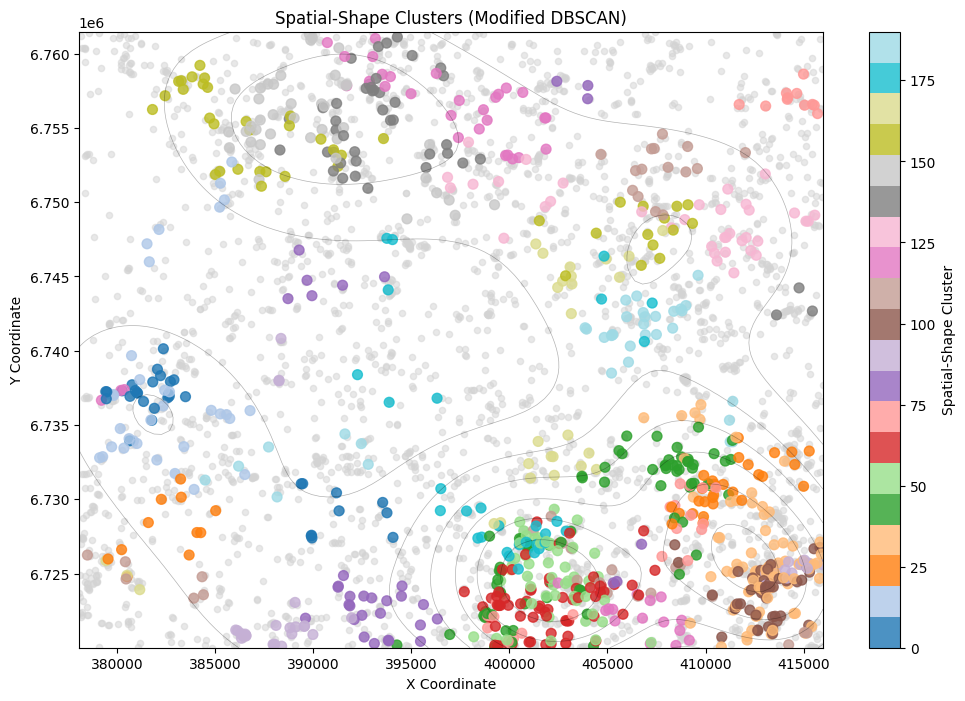

Number of clusters: 191
Number of noise points: 3392


In [222]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# Tune DBSCAN parameters for better clustering
# Use a larger eps and smaller min_samples for sparser data

# Combine coordinates and key shape metrics
X = np.column_stack([
    metrics_in_plot['x'],
    metrics_in_plot['y'],
    metrics_in_plot['fractal_dim'],
    metrics_in_plot['clark_evans'],
    metrics_in_plot['elongation'],
    # metrics_in_plot['alpha_compactness'],
])

# Handle missing values using SimpleImputer
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Standardize the features
X_std = StandardScaler().fit_transform(X_imputed)

# Apply DBSCAN with adjusted parameters
db = DBSCAN(
    eps=0.3,           # Smaller epsilon for tighter clusters
    min_samples=3,     # Fewer minimum samples
    metric='euclidean'
).fit(X_std)

# Add cluster labels to dataframe
metrics_in_plot['spatial_cluster'] = db.labels_

# Plot only non-noise points (label != -1)
fig, ax = plt.subplots(figsize=(12, 8))

# Plot noise points in gray
noise_mask = metrics_in_plot['spatial_cluster'] == -1
ax.scatter(
    metrics_in_plot[noise_mask]['x'],
    metrics_in_plot[noise_mask]['y'],
    c='lightgray',
    s=20,
    alpha=0.5,
    label='Noise'
)

# Plot clustered points with distinct colors
# Plot clustered points with distinct colors
cluster_mask = ~noise_mask
scatter = ax.scatter(
    metrics_in_plot[cluster_mask]['x'],
    metrics_in_plot[cluster_mask]['y'],
    c=metrics_in_plot[cluster_mask]['spatial_cluster'],
    cmap='tab20',
    s=50,
    alpha=0.8
)

# Add contour plot for cluster boundaries
xx, yy = np.mgrid[
    metrics_in_plot['x'].min():metrics_in_plot['x'].max():100j,
    metrics_in_plot['y'].min():metrics_in_plot['y'].max():100j
]

positions = np.vstack([xx.ravel(), yy.ravel()])
values = metrics_in_plot[cluster_mask]['spatial_cluster'].values
kernel = gaussian_kde(
    np.vstack([
        metrics_in_plot[cluster_mask]['x'].values,
        metrics_in_plot[cluster_mask]['y'].values
    ])
)
z = np.reshape(kernel(positions).T, xx.shape)

# Plot contours
ax.contour(xx, yy, z, colors='k', alpha=0.3, linewidths=0.5)

plt.colorbar(scatter, label='Spatial-Shape Cluster')
plt.title('Spatial-Shape Clusters (Modified DBSCAN)')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.show()

# Print cluster statistics
n_clusters = len(set(db.labels_)) - (1 if -1 in db.labels_ else 0)
n_noise = list(db.labels_).count(-1)
print(f'Number of clusters: {n_clusters}')
print(f'Number of noise points: {n_noise}')

In [96]:
# Convert ema10_vals to a NumPy array for element-wise operations
ema10_vals = [1827, 1820]
ema10_vals = np.array(ema10_vals)

# Compute percentage changes from the first EMA10 value in this window.
base = ema10_vals[0]
pct_changes = (ema10_vals - base) / base  # relative changes

# Use indices as x values (0, 1, ..., 4)
x = np.arange(len(pct_changes))
slope = np.polyfit(x, pct_changes, 1)[0]  # slope in % change per time unit
# Convert the slope to an angle (in degrees)
slope_angle = np.degrees(np.arctan(slope))
print(f"Slope angle: {slope_angle:.2f}°")

Slope angle: -0.22°


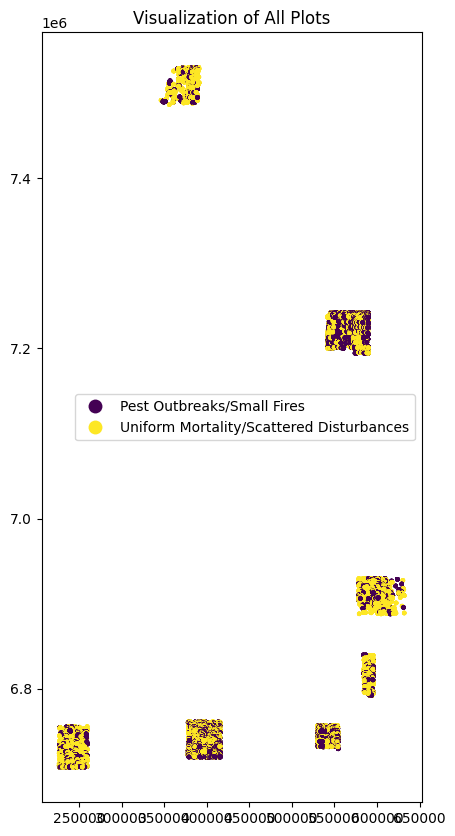

In [313]:
# Combine all plots into a single plot
fig, ax = plt.subplots(figsize=(12, 10))

# Plot all clusters with their morphological labels
filtered_clusters.plot(
    column='morph_label',
    categorical=True,
    legend=True,
    ax=ax,
    markersize=5,
    cmap='viridis'
)

# Add title
plt.title('Visualization of All Plots')
plt.show()


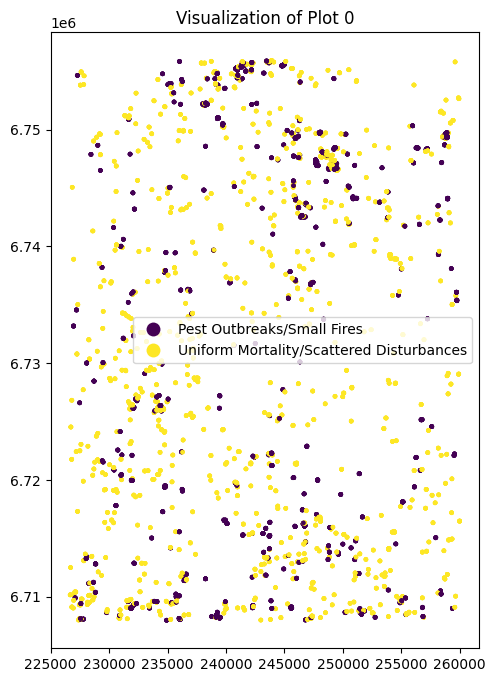

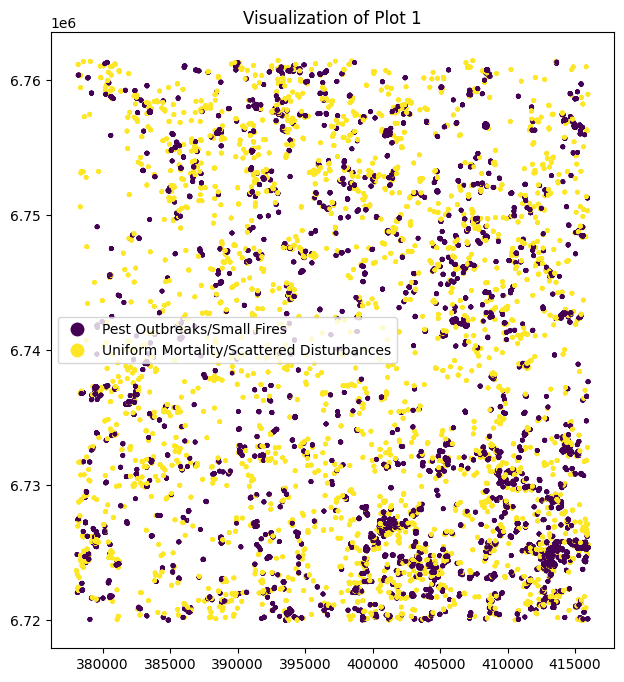

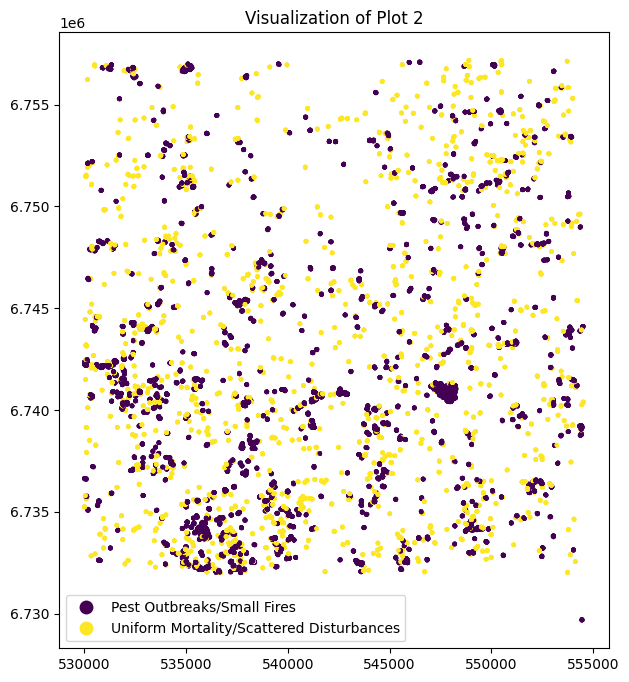

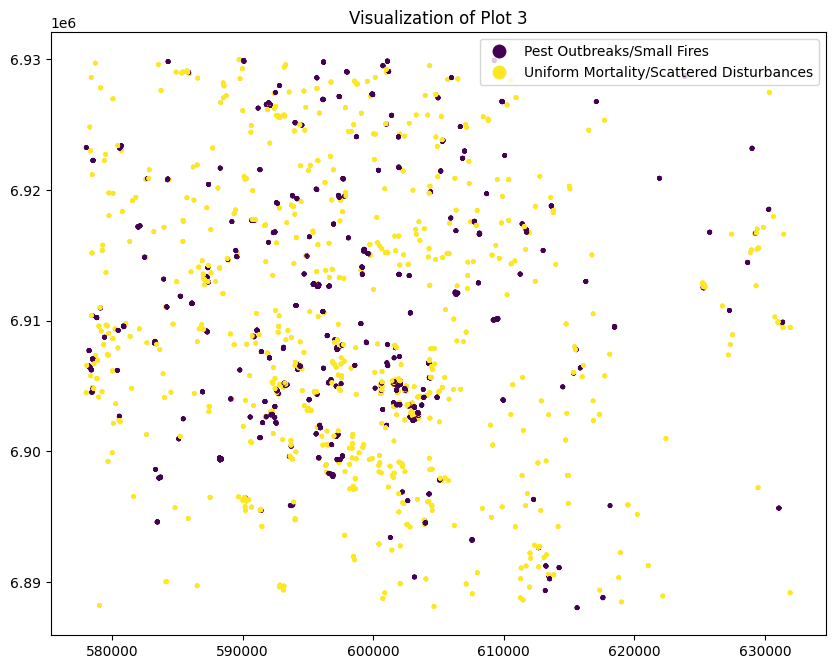

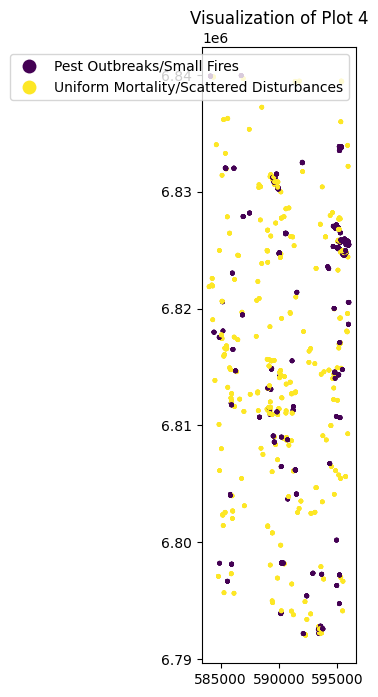

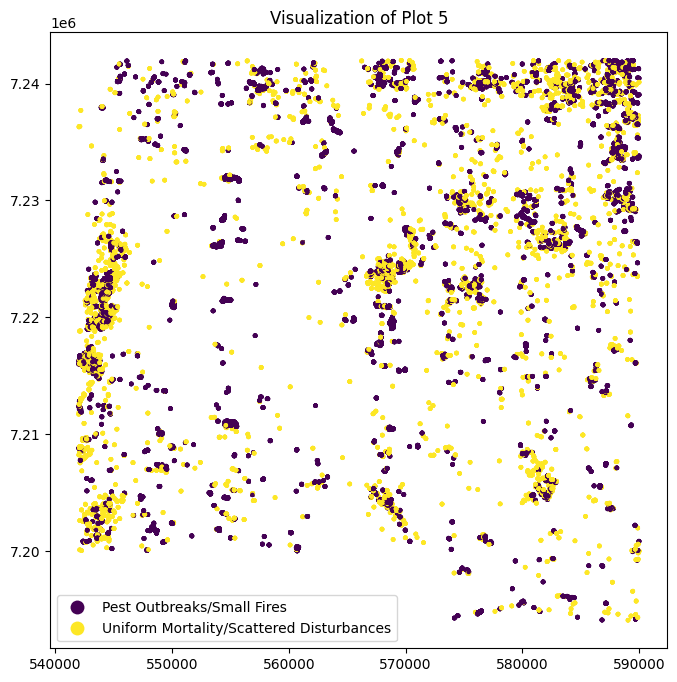

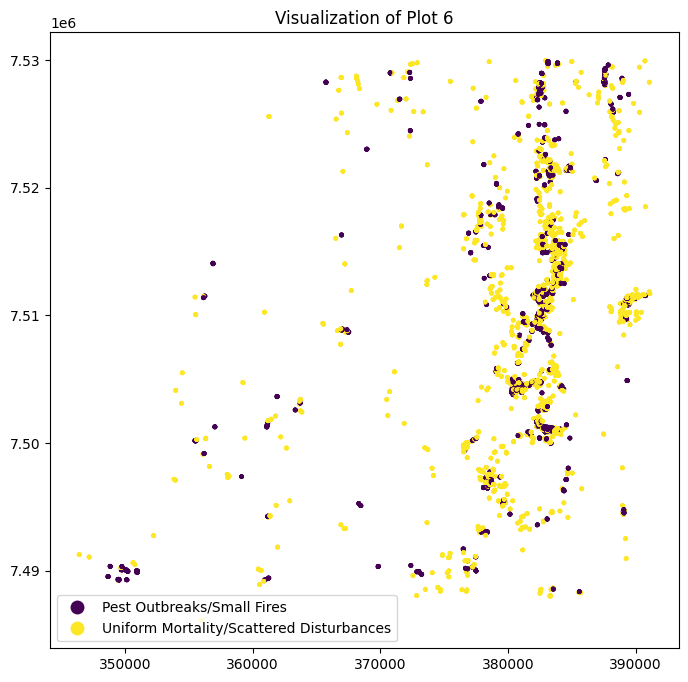

In [314]:
# Iterate over unique plot IDs and plot each plot independently
unique_plot_ids = filtered_clusters['plot_id'].unique()

for plot_id in unique_plot_ids:
    # Subset data for the current plot
    plot_data = filtered_clusters[filtered_clusters['plot_id'] == plot_id]
    
    # Create a plot
    fig, ax = plt.subplots(figsize=(10, 8))
    plot_data.plot(
        column='morph_label',
        categorical=True,
        legend=True,
        ax=ax,
        markersize=5,
        cmap='viridis'
    )
    
    # Add title
    plt.title(f'Visualization of Plot {plot_id}')
    plt.show()


### Spatial Hotspot Analysis

Step 1: Prepare Spatial Weights Matrix

In [231]:
import numpy as np

from esda.moran import Moran_Local
from libpysal.weights import DistanceBand
from scipy.spatial import KDTree  # Import KDTree

# Initialize results list
lisa_results = []

for plot_id in filtered_with_centroids['plot_id'].unique():
    # Subset data for the current plot
    plot_data = filtered_with_centroids[filtered_with_centroids['plot_id'] == plot_id].copy()
    
    # Skip plots with <5 clusters (LISA requires neighbors)
    if len(plot_data) < 5:
        print(f"Skipping Plot {plot_id}: <5 clusters")
        continue
    
    # Compute centroids and check variance
    centroid_coords = plot_data[['x', 'y']].values
    if np.var(plot_data['fractal_dim'].values) == 0:
        print(f"Skipping Plot {plot_id}: zero variance in fractal_dim")
        continue
    
    # Adaptive distance threshold (50% of max nearest-neighbor distance)
    try:
        # Find 1st nearest neighbor distances
        tree = KDTree(centroid_coords)
        distances, _ = tree.query(centroid_coords, k=2)
        max_nn_dist = np.max(distances[:, 1])  # 2nd column excludes self-distance
        threshold = max(10, 1.5 * max_nn_dist)  # Ensure minimum 10m
    except:
        print(f"Skipping Plot {plot_id}: invalid centroids")
        continue
    
    # Build weights matrix
    try:
        w = DistanceBand(centroid_coords, threshold=threshold, silence_warnings=True)
        if w.n_components > 1 or w.islands:
            print(f"Skipping Plot {plot_id}: disconnected clusters")
            continue
    except:
        print(f"Skipping Plot {plot_id}: invalid weights matrix")
        continue
    
    # Compute Local Moran’s I
    try:
        lisa = Moran_Local(
            plot_data['fractal_dim'].values, 
            w, 
            permutations=999, 
            n_jobs=-1  # Use all CPU cores
        )
        plot_data['lisa_p'] = lisa.p_sim
        plot_data['lisa_q'] = lisa.q  # 1=HH, 2=LH, 3=LL, 4=HL
        lisa_results.append(plot_data)
    except Exception as e:
        print(f"Skipping Plot {plot_id}: {str(e)}")
        continue

# Combine results
lisa_gdf = pd.concat(lisa_results) if lisa_results else None

Skipping Plot 4: disconnected clusters
Skipping Plot 6: disconnected clusters


In [232]:
from shapely.geometry import Point  

# Convert x/y to Point geometries  
lisa_gdf['geometry'] = lisa_gdf.apply(lambda row: Point(row['x'], row['y']), axis=1)  

# Convert to GeoDataFrame (if not already)  
from geopandas import GeoDataFrame  
lisa_gdf = GeoDataFrame(lisa_gdf, crs="EPSG:3067")  # Use Finland's CRS  

Step 2: Visualize Hotspots

A. Plot Hotspots of High Fractal Dimension (Complex Shapes)

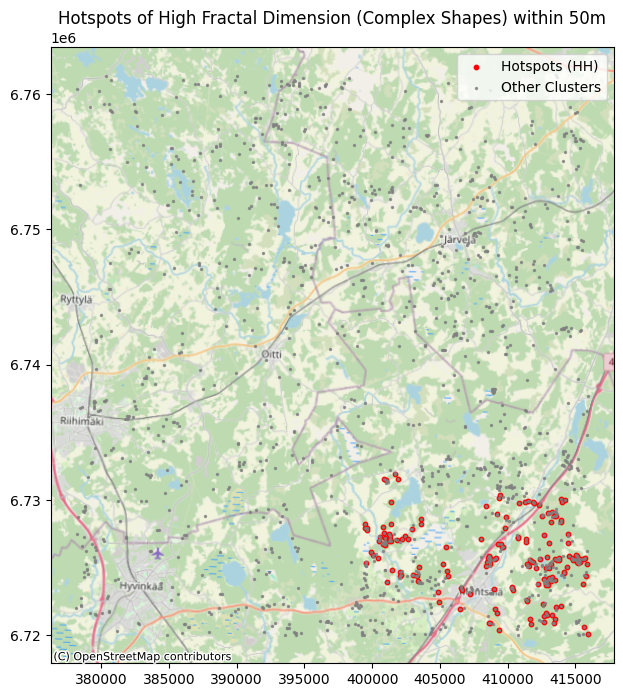

In [344]:
import contextily as ctx

plotdata = lisa_gdf[lisa_gdf.plot_id == 1]

# Subset significant hotspots (p < 0.05, HH=1, plot_id=0)
hotspots = plotdata[(plotdata['lisa_p'] < 0.05) & (plotdata['lisa_q'] == 1)]

# Plot
fig, ax = plt.subplots(figsize=(12, 8))
hotspots.plot(ax=ax, color='red', markersize=10, label='Hotspots (HH)')
plotdata.plot(ax=ax, color='gray', markersize=2, alpha=0.8, label='Other Clusters')
ctx.add_basemap(ax, crs="EPSG:3067", source=ctx.providers.OpenStreetMap.Mapnik)
plt.title(f'Hotspots of High Fractal Dimension (Complex Shapes) within {distance_threshold}m')
plt.legend()
plt.show()

B. Plot Coldspots of Fractal Dimension (Simple Shapes)

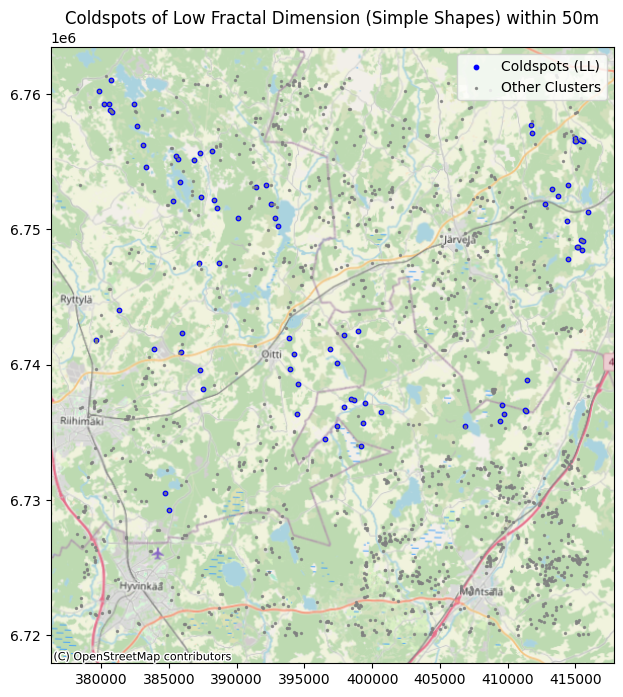

In [246]:
# Subset significant coldspots (p < 0.05, LL=3)
coldspots = plotdata[(plotdata['lisa_p'] < 0.05) & (plotdata['lisa_q'] == 3)]

# Plot
fig, ax = plt.subplots(figsize=(12, 8))
coldspots.plot(ax=ax, color='blue', markersize=10, label='Coldspots (LL)')
plotdata.plot(ax=ax, color='grey', markersize=2, alpha=0.8, label='Other Clusters')
ctx.add_basemap(ax, crs="EPSG:3067", source=ctx.providers.OpenStreetMap.Mapnik)
plt.title(f'Coldspots of Low Fractal Dimension (Simple Shapes) within {distance_threshold}m')
plt.legend()
plt.show()

Step 3: Interpret Results

In [249]:
hotspots = lisa_gdf[(lisa_gdf['lisa_p'] < 0.05) & (lisa_gdf['lisa_q'] == 1)]

# Summary of hotspots
print(hotspots.groupby('plot_id').agg({
    'fractal_dim': ['mean', 'count'],
    'clark_evans': 'mean',
    'elongation': 'mean'
}))

        fractal_dim       clark_evans elongation
               mean count        mean       mean
plot_id                                         
0          0.592103    19    1.381181   1.958916
1          0.621799   173    1.374035   1.982901
2          0.603176    26    1.440772   1.827898
3          0.603208    28    1.459817   2.246758
5          0.677016   104    1.392863   2.220515


In [ ]:
# Repeat this for Clark-Evans Index or elongation
lisa_ce = Moran_Local(plot_data['clark_evans'].values, w, permutations=999)
plot_data['lisa_p_ce'] = lisa_ce.p_sim
plot_data['lisa_q_ce'] = lisa_ce.q

### Anamoly Detection

Step 1: Prepare Data

In [334]:
from sklearn.ensemble import IsolationForest
import numpy as np

# Select shape metrics for anomaly detection
X = filtered_metrics[['fractal_dim', 'clark_evans', 'elongation', 'alpha_compactness']]

# Standardize features (critical for Isolation Forest)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

Step 2: Train Isolation Forest Model

In [335]:
# Adjust contamination based on expected outlier fraction (default=0.01 for 1%)
iso = IsolationForest(contamination=0.02, random_state=0)  # Assume 2% outliers
outliers = iso.fit_predict(X_scaled)

# Add anomaly labels to DataFrame
filtered_metrics['is_outlier'] = np.where(outliers == -1, 1, 0)  # -1 = outlier

/var/folders/b1/qgbsvl0n4hlf_mxy5hyf7_740000gn/T/ipykernel_69974/118656939.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_metrics['is_outlier'] = np.where(outliers == -1, 1, 0)  # -1 = outlier


Step 3: Analyze Outliers

In [336]:
outlier_summary = filtered_metrics[filtered_metrics['is_outlier'] == 1].describe()
print(outlier_summary[['fractal_dim', 'clark_evans', 'elongation', 'alpha_compactness']])

       fractal_dim  clark_evans  elongation  alpha_compactness
count   292.000000   292.000000  292.000000         253.000000
mean      0.632959     2.102260    5.281681           0.525584
std       0.293927     1.245235    3.070224           0.291374
min       0.287296     0.703765    1.000496           0.126609
25%       0.338008     1.017422    2.036201           0.278000
50%       0.605736     1.333975    5.769203           0.444822
75%       0.902765     3.440866    8.155073           0.720205
max       1.236915     4.582682    9.943187           1.000000


Step 4: Visualize Anomalies


A. Feature Space Visualization (t-SNE)


In [337]:
from sklearn.manifold import TSNE

# Handle NaN values in X_scaled
X_scaled = np.nan_to_num(X_scaled)  # Replace NaN with 0 (or use np.nanmean for column mean)

# Reduce dimensionality for visualization
tsne = TSNE(n_components=2, random_state=0)
X_tsne = tsne.fit_transform(X_scaled)

# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=X_tsne[:,0], 
    y=X_tsne[:,1], 
    hue=metrics_df['is_outlier'],
    palette={0: 'grey', 1: 'red'},
    alpha=0.7
)
plt.title('t-SNE of Shape Metrics (Outliers in Red)')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.legend(title='Is Outlier')
plt.show()

ValueError: array length 14582 does not match index length 43539

<Figure size 1000x600 with 0 Axes>

B. Pairplot Highlighting Outliers


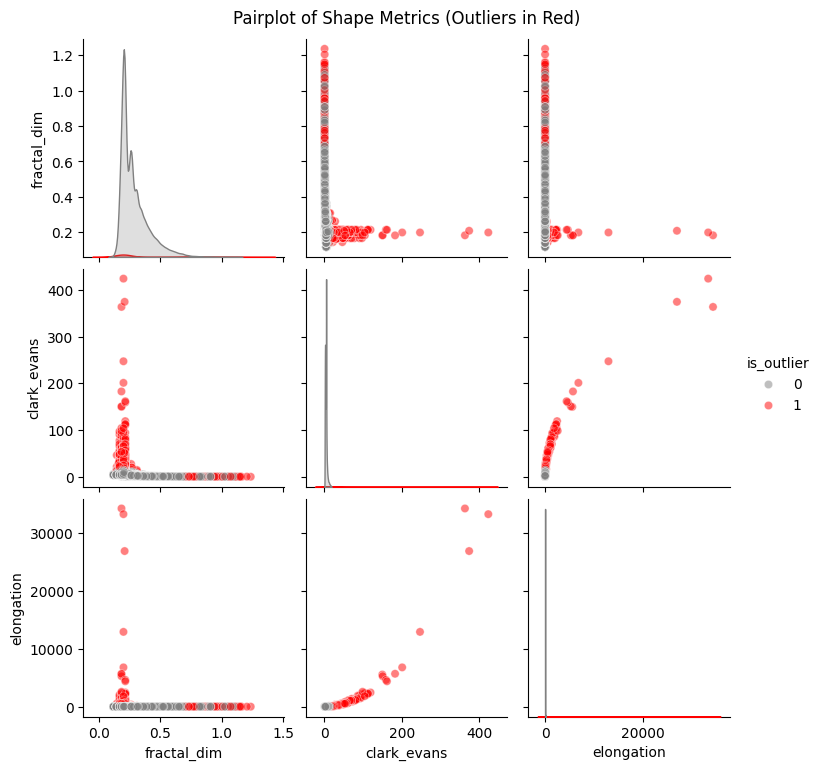

In [260]:
sns.pairplot(
    metrics_df,
    vars=['fractal_dim', 'clark_evans', 'elongation'],
    hue='is_outlier',
    palette={0: 'grey', 1: 'red'},
    plot_kws={'alpha': 0.5}
)
plt.suptitle('Pairplot of Shape Metrics (Outliers in Red)', y=1.02)
plt.show()

C. Spatial Distribution of Outliers


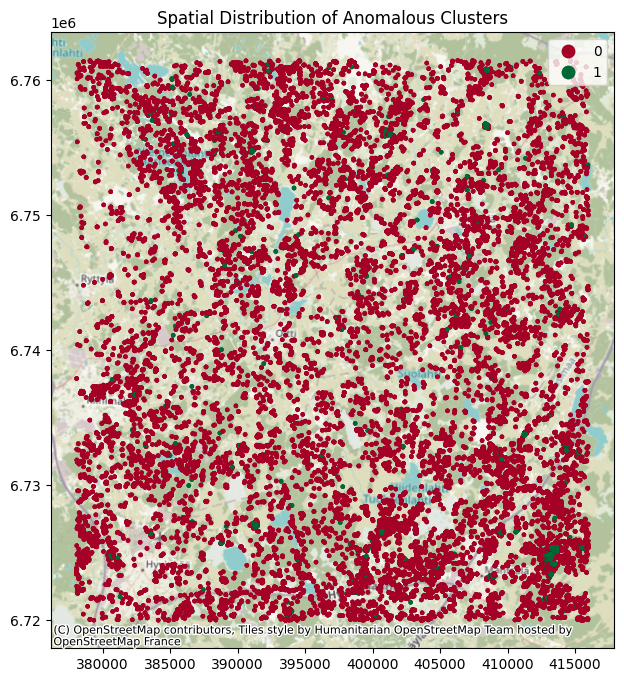

In [264]:
# Merge with spatial data
outlier_gdf = clustered_data.merge(
    metrics_df[['cluster_id', 'is_outlier']].rename(columns={'cluster_id': 'cluster'}), 
    on='cluster', 
    how='left'
)

plotdata = outlier_gdf[outlier_gdf.plot_id == 1]

# Plot
fig, ax = plt.subplots(figsize=(12, 8))
plotdata.plot(
    column='is_outlier',
    categorical=True,
    cmap='RdYlGn',  # Red = outlier, Green = normal
    legend=True,
    markersize=5,
    ax=ax
)
ctx.add_basemap(ax, crs=outlier_gdf.crs.to_string())
plt.title('Spatial Distribution of Anomalous Clusters')
plt.show()

In [265]:
extreme_outliers = metrics_df[
    (metrics_df['is_outlier'] == 1) &
    (metrics_df['elongation'] > 4.5)
]
print(extreme_outliers[['cluster_id', 'fractal_dim', 'elongation']])

       cluster_id  fractal_dim    elongation
18             18     0.213672    210.237557
178           177     0.182585    528.295020
185           184     0.213672    480.242624
189           188     0.198593  12934.700944
209           208     0.198593    287.128825
...           ...          ...           ...
43216       43216     0.198593    110.618327
43287       43287     0.166165     82.037906
43413       43413     0.204067     80.476372
43422       43422     0.208198    530.978859
43482       43482     0.182174    524.727193

[732 rows x 3 columns]


In [266]:
sns.countplot(
    x='morph_label',
    hue='is_outlier',
    data=metrics_df
)

ValueError: Could not interpret value `morph_label` for `x`. An entry with this name does not appear in `data`.

### Network Analysis

Step 1: Build a Proximity Network


A. Create Edges Between Nearby Clusters

In [ ]:
import networkx as nx
from scipy.spatial import KDTree

# Extract cluster centroids (assuming `filtered_gdf` is your spatial data)
centroids = filtered_gdf[['x', 'y']].values
coords = centroids  # Use the centroids array directly

# Define proximity threshold (e.g., 50 meters for pest spread)
proximity_threshold = 50  # Adjust based on ecological context

# Build a KDTree for efficient distance queries
tree = KDTree(coords)
edges = tree.query_pairs(proximity_threshold)

# Initialize graph and add edges
G = nx.Graph()
G.add_edges_from(edges)
print(f"Network has {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")

Network has 40 nodes and 20 edges.


Step 2: Analyze Network Properties

A. Degree Distribution

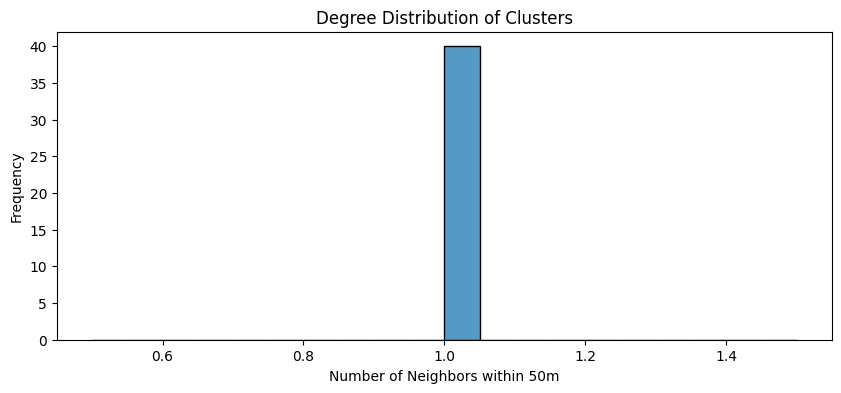

In [128]:
degrees = dict(G.degree())
filtered_gdf['degree'] = filtered_gdf.index.map(degrees)

# Plot degree distribution
plt.figure(figsize=(10, 4))
sns.histplot(filtered_gdf['degree'], bins=20, kde=False)
plt.title('Degree Distribution of Clusters')
plt.xlabel('Number of Neighbors within 50m')
plt.ylabel('Frequency')
plt.show()

In [131]:
from shapely.geometry import Point  

# Convert x/y to Point geometries  
filtered_gdf['geometry'] = filtered_gdf.apply(lambda row: Point(row['x'], row['y']), axis=1)  

# Convert to GeoDataFrame (if not already)  
from geopandas import GeoDataFrame  
filtered_gdf = GeoDataFrame(filtered_gdf, crs="EPSG:3067")  # Use Finland's CRS  

B. Betweenness Centrality

/var/folders/b1/qgbsvl0n4hlf_mxy5hyf7_740000gn/T/ipykernel_69974/944484519.py:8: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  high_centrality.plot(ax=ax, color='red', markersize=50, alpha=0.7, label='High Centrality')


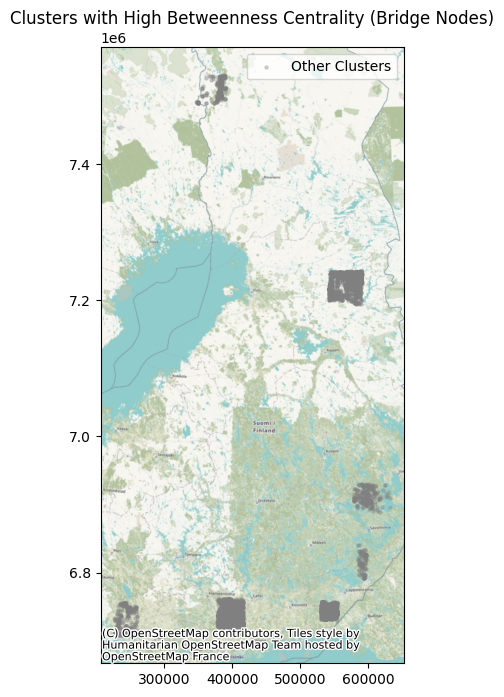

In [132]:
# Calculate betweenness centrality (computationally intensive for large networks)
betweenness = nx.betweenness_centrality(G, normalized=True)
filtered_gdf['betweenness'] = filtered_gdf.index.map(betweenness)

# Plot spatial distribution of high-centrality nodes
high_centrality = filtered_gdf[filtered_gdf['betweenness'] > 0.1]
fig, ax = plt.subplots(figsize=(12, 8))
high_centrality.plot(ax=ax, color='red', markersize=50, alpha=0.7, label='High Centrality')
filtered_gdf.plot(ax=ax, color='grey', markersize=5, alpha=0.3, label='Other Clusters')
ctx.add_basemap(ax, crs="EPSG:3067")
plt.title('Clusters with High Betweenness Centrality (Bridge Nodes)')
plt.legend()
plt.show()

Step 3: Community Detection

A. Identify Connected Components

In [133]:
# Find all connected components (isolated subgraphs)
components = list(nx.connected_components(G))
component_sizes = [len(c) for c in components]
print(f"Largest connected component has {max(component_sizes)} clusters.")

# Label clusters by component ID
component_labels = {}
for i, component in enumerate(components):
    for node in component:
        component_labels[node] = i
filtered_gdf['component_id'] = filtered_gdf.index.map(component_labels)

Largest connected component has 2 clusters.


B. Detect Communities (Louvain Algorithm)

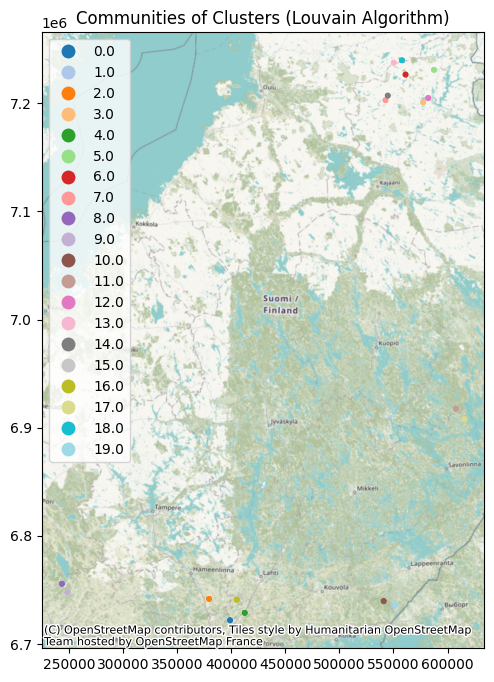

In [135]:
from community import community_louvain  # Requires `python-louvain` package

# Run Louvain algorithm for community detection
partition = community_louvain.best_partition(G)
filtered_gdf['community_id'] = filtered_gdf.index.map(partition)

# Plot communities
fig, ax = plt.subplots(figsize=(12, 8))
filtered_gdf.plot(
    column='community_id',
    categorical=True,
    legend=True,
    cmap='tab20',
    markersize=10,
    ax=ax
)
ctx.add_basemap(ax, crs=filtered_gdf.crs.to_string())
plt.title('Communities of Clusters (Louvain Algorithm)')
plt.show()

Step 5: Export Network Data

In [136]:
# Save network for GIS software (e.g., QGIS)
edges_gdf = gpd.GeoDataFrame(
    geometry=[LineString([coords[u], coords[v]]) for u, v in G.edges],
    crs=filtered_gdf.crs
)
edges_gdf.to_file("cluster_network_edges.gpkg", driver="GPKG")
filtered_gdf.to_file("cluster_network_nodes.gpkg", driver="GPKG")

<Axes: xlabel='community_id', ylabel='fractal_dim'>

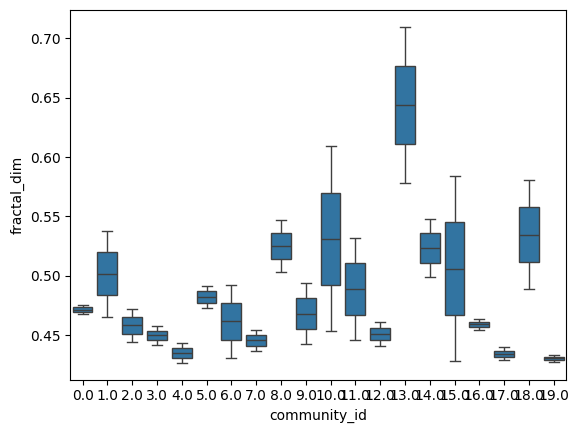

In [137]:
sns.boxplot(x='community_id', y='fractal_dim', data=filtered_gdf)

### Dimensionality Reduction

Step 1: Prepare Data

In [144]:
from sklearn.decomposition import PCA

from umap.umap_ import UMAP  # Ensure you have installed umap-learn
import matplotlib.pyplot as plt
import seaborn as sns

# Subset shape metrics
X = filtered_metrics[['fractal_dim', 'clark_evans', 'elongation', 'alpha_compactness']]

# Standardize features
X_scaled = StandardScaler().fit_transform(X)

/Users/anisr/Documents/TreeClusters/venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Step 2: Principal Component Analysis (PCA)

A. Fit PCA and Interpret Components

In [147]:
from sklearn.impute import SimpleImputer

# Handle NaN values by imputing with the mean of each column
imputer = SimpleImputer(strategy='mean')
X_scaled_imputed = imputer.fit_transform(X_scaled)

# Apply PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled_imputed)

# Variance explained
print(f"Variance explained by PC1: {pca.explained_variance_ratio_[0]:.2f}")
print(f"Variance explained by PC2: {pca.explained_variance_ratio_[1]:.2f}")

# Component loadings
loadings = pd.DataFrame(
    pca.components_.T,
    columns=['PC1', 'PC2'],
    index=X.columns
)
print(loadings)

Variance explained by PC1: 0.59
Variance explained by PC2: 0.24
                        PC1       PC2
fractal_dim       -0.577396  0.167687
clark_evans        0.611325  0.004746
elongation         0.287495  0.914373
alpha_compactness  0.458522 -0.368484


Step 3: Uniform Manifold Approximation (UMAP)

In [149]:
from sklearn.impute import SimpleImputer

# Handle NaN values in X_scaled by imputing with the mean
imputer = SimpleImputer(strategy='mean')
X_scaled_imputed = imputer.fit_transform(X_scaled)

# Apply UMAP
umap = UMAP(n_components=2, random_state=0)
X_umap = umap.fit_transform(X_scaled_imputed)

/Users/anisr/Documents/TreeClusters/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/anisr/Documents/TreeClusters/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Step 4: Visualize Reduced Dimensions

A. Color by Morphological Type

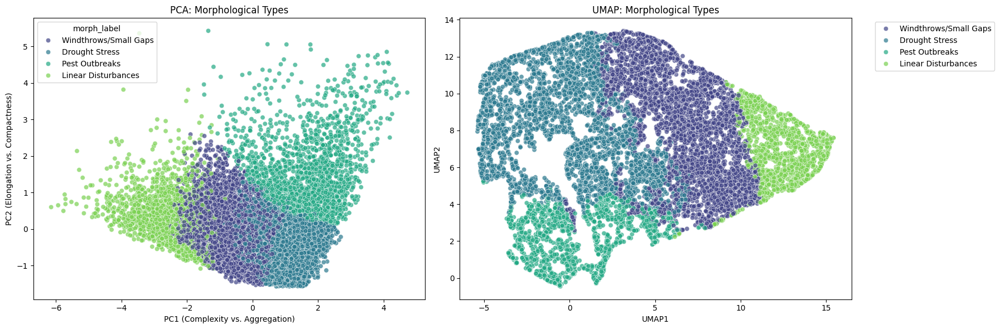

In [150]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# PCA
sns.scatterplot(
    x=X_pca[:,0], y=X_pca[:,1],
    hue=filtered_metrics['morph_label'],
    palette='viridis',
    alpha=0.7,
    ax=axes[0]
)
axes[0].set_title('PCA: Morphological Types')
axes[0].set_xlabel('PC1 (Complexity vs. Aggregation)')
axes[0].set_ylabel('PC2 (Elongation vs. Compactness)')

# UMAP
sns.scatterplot(
    x=X_umap[:,0], y=X_umap[:,1],
    hue=filtered_metrics['morph_label'],
    palette='viridis',
    alpha=0.7,
    ax=axes[1]
)
axes[1].set_title('UMAP: Morphological Types')
axes[1].set_xlabel('UMAP1')
axes[1].set_ylabel('UMAP2')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

B. Color by Outliers

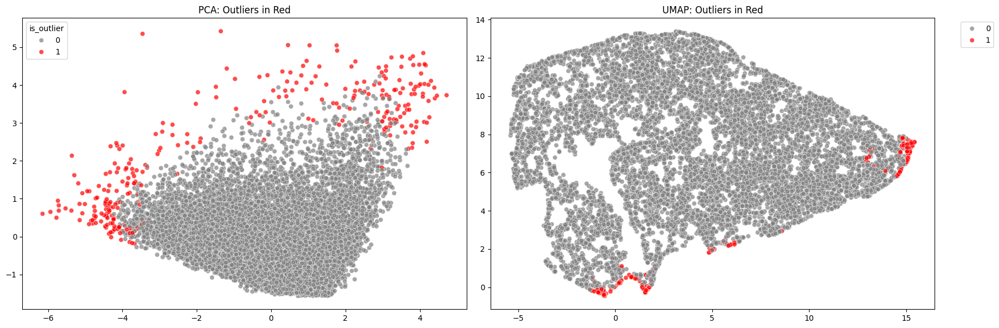

In [151]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# PCA
sns.scatterplot(
    x=X_pca[:,0], y=X_pca[:,1],
    hue=filtered_metrics['is_outlier'],
    palette={0: 'grey', 1: 'red'},
    alpha=0.7,
    ax=axes[0]
)
axes[0].set_title('PCA: Outliers in Red')

# UMAP
sns.scatterplot(
    x=X_umap[:,0], y=X_umap[:,1],
    hue=filtered_metrics['is_outlier'],
    palette={0: 'grey', 1: 'red'},
    alpha=0.7,
    ax=axes[1]
)
axes[1].set_title('UMAP: Outliers in Red')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Step 6: 3D Projection (Optional)

/Users/anisr/Documents/TreeClusters/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/anisr/Documents/TreeClusters/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


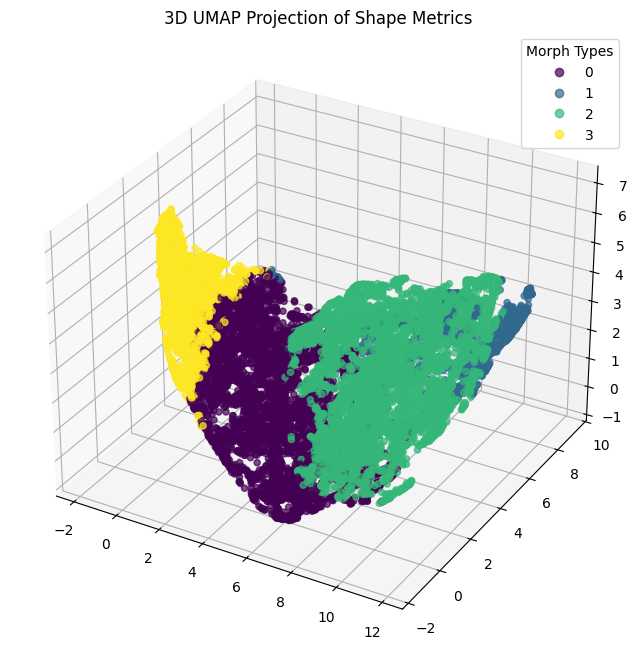

In [153]:
from mpl_toolkits.mplot3d import Axes3D

from sklearn.impute import SimpleImputer

# Handle NaN values in X_scaled by imputing with the mean
X_scaled_imputed = imputer.fit_transform(X_scaled)

# Fit UMAP in 3D
umap_3d = UMAP(n_components=3, random_state=0)
X_umap_3d = umap_3d.fit_transform(X_scaled_imputed)

# Plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    X_umap_3d[:,0], X_umap_3d[:,1], X_umap_3d[:,2],
    c=filtered_metrics['morph_type'],
    cmap='viridis',
    alpha=0.7
)
plt.title('3D UMAP Projection of Shape Metrics')
plt.legend(*scatter.legend_elements(), title='Morph Types')
plt.show()

### Cluster Analysis

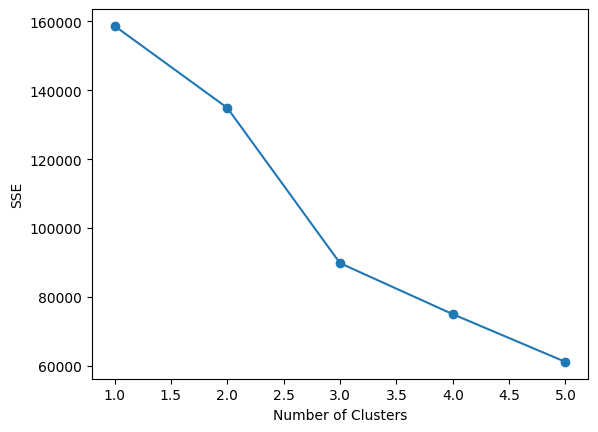

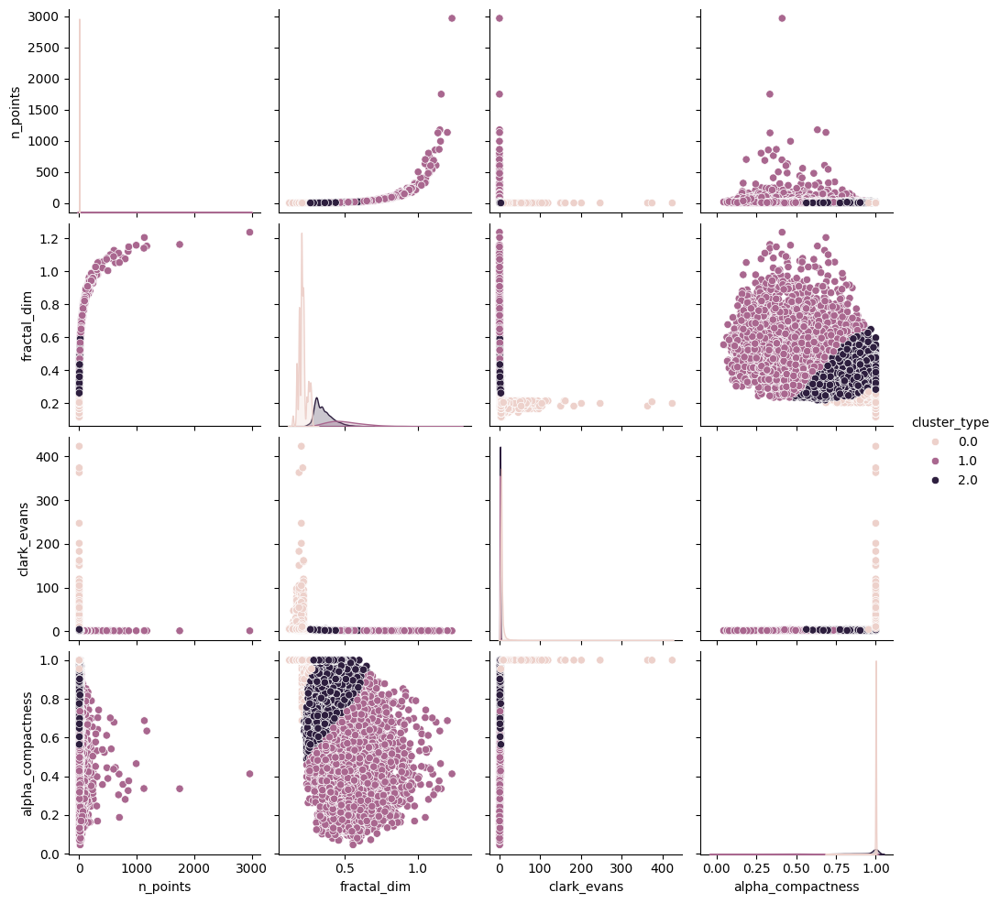

In [15]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Prepare data
X = metrics_df[['n_points', 'fractal_dim', 'clark_evans', 'alpha_compactness']].dropna()
X_scaled = StandardScaler().fit_transform(X)

# Elbow method for optimal k
sse = []
for k in range(1, 6):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X_scaled)
    sse.append(kmeans.inertia_)
plt.plot(range(1, 6), sse, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('SSE')
plt.show()

# Fit K-Means (assuming k=3)
kmeans = KMeans(n_clusters=3, random_state=0).fit(X_scaled)

# Create a new column for cluster labels, initializing with NaN
metrics_df['cluster_type'] = np.nan

# Assign cluster labels to the rows used in clustering
metrics_df.loc[X.index, 'cluster_type'] = kmeans.labels_

# Visualize types
sns.pairplot(metrics_df, hue='cluster_type', 
             vars=['n_points', 'fractal_dim', 'clark_evans', 'alpha_compactness'])

### Plot-level Moran's I

In [71]:
from esda.moran import Moran
from libpysal.weights import DistanceBand
import numpy as np

moran_results = []

for plot_id in metrics_df['plot_id'].unique():
    # Filter clusters for this plot
    plot_clusters = metrics_df[metrics_df['plot_id'] == plot_id]
    
    # Skip plots with <2 clusters (Moran's I undefined)
    if len(plot_clusters) < 2:
        print(f"Skipping plot {plot_id}: <2 clusters")
        continue
        
    # Extract cluster centroids (assuming clustered_data has geometry)
    clusters_in_plot = clustered_data[clustered_data['cluster'].isin(plot_clusters['cluster_id'])]
    centroids = clusters_in_plot.dissolve(by='cluster').centroid
    centroid_coords = np.array([[geom.x, geom.y] for geom in centroids])
    
    # Check variance in cluster size (n_points)
    n_points = plot_clusters['n_points'].values
    if np.var(n_points) == 0:
        print(f"Skipping plot {plot_id}: zero variance in n_points")
        continue
    
    # Adaptive distance threshold (50% of max pairwise distance)
    distances = np.sqrt(np.sum((centroid_coords[:, None] - centroid_coords) ** 2, axis=2))
    max_dist = np.max(distances) if len(centroid_coords) > 1 else 0
    threshold = max(1000, 0.5 * max_dist)  # Ensure ≥1km if max_dist is tiny
    
    # Build weights matrix
    try:
        w = DistanceBand(centroid_coords, threshold=threshold, silence_warnings=True)
        if w.n == 0 or w.n_components > 1:
            print(f"Skipping plot {plot_id}: disconnected weights matrix")
            continue
    except:
        print(f"Skipping plot {plot_id}: invalid weights")
        continue
    
    # Compute Moran's I safely
    try:
        moran = Moran(n_points, w, permutations=999)
        moran_results.append({
            'plot_id': plot_id,
            'moran_i': moran.I,
            'p_value': moran.p_sim,
            'n_clusters': len(centroids)
        })
    except ZeroDivisionError:
        print(f"Skipping plot {plot_id}: division by zero in Moran's I")

moran_plot_df = pd.DataFrame(moran_results)

        plot_id   moran_i   p_value    n_clusters
count  7.000000  7.000000  7.000000      7.000000
mean   3.000000  0.000149  0.078714   6219.857143
std    2.160247  0.000716  0.113790   3814.363749
min    0.000000 -0.000490  0.001000   1433.000000
25%    1.500000 -0.000217  0.007500   4374.000000
50%    3.000000  0.000064  0.021000   4819.000000
75%    4.500000  0.000105  0.110500   8173.000000
max    6.000000  0.001691  0.293000  12193.000000


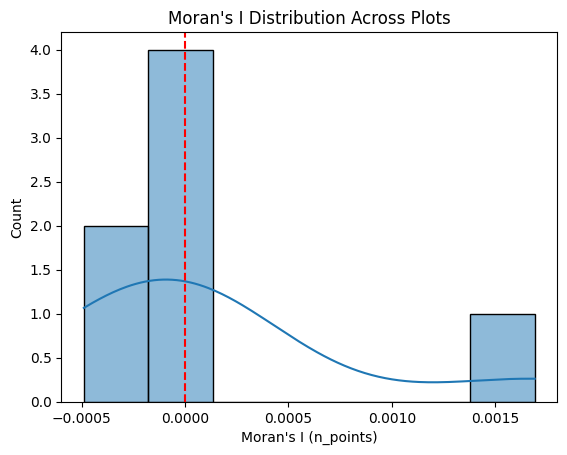

In [72]:
# Summary of valid plots
print(moran_plot_df.describe())

# Visualize Moran's I distribution
import seaborn as sns
sns.histplot(moran_plot_df['moran_i'], kde=True)
plt.axvline(0, color='red', linestyle='--')
plt.title('Moran\'s I Distribution Across Plots')
plt.xlabel('Moran\'s I (n_points)')
plt.show()

In [75]:
print(moran_plot_df)

   plot_id   moran_i  p_value  n_clusters
0        0  0.000132    0.039        4661
1        1  0.001691    0.001       12193
2        2 -0.000137    0.293        5710
3        3  0.000079    0.021        4087
4        4 -0.000490    0.182        1433
5        5 -0.000297    0.005       10636
6        6  0.000064    0.010        4819


In [106]:
from esda.moran import Moran
from libpysal.weights import DistanceBand
import pandas as pd

# Define shape metrics to analyze
shape_metrics = ['fractal_dim', 'clark_evans', 'elongation', 'alpha_compactness']

# Initialize results DataFrame
results = []

for plot_id in metrics_df['plot_id'].unique():
    # Filter clusters in this plot
    plot_data = metrics_df[metrics_df['plot_id'] == plot_id].dropna()
    if len(plot_data) < 2:
        print(f"Skipping plot {plot_id}: <2 clusters")
        continue
    
    # Get cluster centroids (assuming clustered_data has geometry)
    clusters_in_plot = clustered_data[clustered_data['cluster'].isin(plot_data['cluster_id'])]
    centroids = clusters_in_plot.dissolve(by='cluster').centroid
    centroid_coords = np.array([[geom.x, geom.y] for geom in centroids])
    
    # Adaptive distance threshold (50% of max pairwise distance)
    distances = np.sqrt(np.sum((centroid_coords[:, None] - centroid_coords) ** 2, axis=2))
    max_dist = np.max(distances) if len(centroid_coords) > 1 else 0
    threshold = max(1000, 0.5 * max_dist)  # Ensure ≥1km if max_dist is tiny
    
    # Build weights matrix
    try:
        w = DistanceBand(centroid_coords, threshold=threshold, silence_warnings=True)
        if w.n == 0 or w.n_components > 1:
            print(f"Skipping plot {plot_id}: disconnected weights matrix")
            continue
    except:
        print(f"Skipping plot {plot_id}: invalid weights")
        continue
    
    # Compute Moran's I for each shape metric
    for metric in shape_metrics:
        values = plot_data[metric].values
        if np.var(values) == 0:
            print(f"Skipping {metric} in plot {plot_id}: zero variance")
            continue
        try:
            moran = Moran(values, w, permutations=999)
            results.append({
                'plot_id': plot_id,
                'metric': metric,
                'moran_i': moran.I,
                'p_value': moran.p_sim,
                'n_clusters': len(centroids)
            })
        except:
            print(f"Failed for {metric} in plot {plot_id}")

# Convert to DataFrame
moran_shape_df = pd.DataFrame(results)

In [102]:
print(moran_shape_df)

    plot_id             metric   moran_i  p_value  n_clusters
0         0        fractal_dim -0.000667    0.002        4661
1         0        clark_evans -0.000160    0.300        4661
2         0         elongation -0.000217    0.414        4661
3         0  alpha_compactness       NaN    0.001        4661
4         1        fractal_dim  0.004717    0.001       12193
5         1        clark_evans -0.000015    0.137       12193
6         1         elongation -0.000120    0.269       12193
7         1  alpha_compactness       NaN    0.001       12193
8         2        fractal_dim  0.001451    0.001        5710
9         2        clark_evans -0.000213    0.416        5710
10        2         elongation -0.000351    0.018        5710
11        2  alpha_compactness       NaN    0.001        5710
12        3        fractal_dim  0.000364    0.002        4087
13        3        clark_evans  0.000330    0.002        4087
14        3         elongation -0.000330    0.212        4087
15      

       plot_id    moran_i    p_value    n_clusters
count  28.0000  21.000000  28.000000     28.000000
mean    3.0000   0.000104   0.139714   6219.857143
std     2.0367   0.001160   0.167054   3596.216630
min     0.0000  -0.000973   0.001000   1433.000000
25%     1.0000  -0.000330   0.001000   4087.000000
50%     3.0000  -0.000168   0.011500   4819.000000
75%     5.0000  -0.000015   0.272500  10636.000000
max     6.0000   0.004717   0.480000  12193.000000


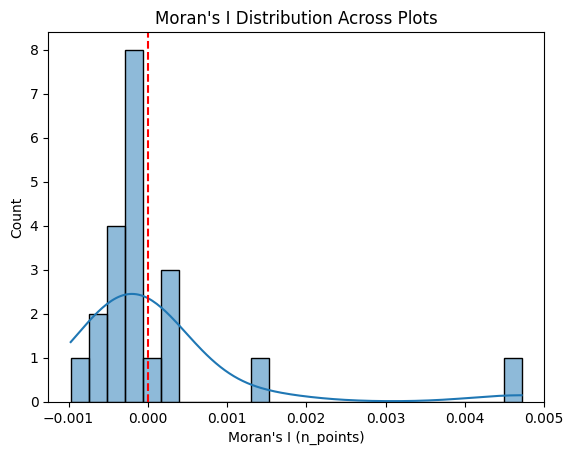

In [ ]:
# Summary of valid plots
print(moran_shape_df.describe())

# Visualize Moran's I distribution
import seaborn as sns
sns.histplot(moran_shape_df['moran_i'], kde=True)
plt.axvline(0, color='red', linestyle='--')
plt.title('Moran\'s I Distribution Across Plots')
plt.xlabel('Moran\'s I (n_points)')
plt.show()

In [105]:
nan_count = metrics_df['alpha_compactness'].isna().sum()
print(f"Number of NaN rows in 'alpha_compactness': {nan_count}")

Number of NaN rows in 'alpha_compactness': 3870


In [97]:
from esda.moran import Moran_Local

# Example: Fractal dimension in Plot 1
plot1_data = metrics_df[metrics_df['plot_id'] == 1]
lisa = Moran_Local(plot1_data['fractal_dim'].values, w, permutations=999)
plot1_data['lisa_p'] = lisa.p_sim
plot1_data['hotspot'] = lisa.q  # 1=HH, 2=LH, 3=LL, 4=HL

# Map hotspots
clustered_data[clustered_data['plot_id'] == 1].plot(
    column='hotspot',
    cmap='viridis',
    legend=True,
    figsize=(12, 8)
)
ctx.add_basemap(ax, crs=clustered_data.crs.to_string())
plt.title('Fractal Dimension Hotspots (Plot 1)')
plt.show()

ValueError: matmul: dimension mismatch with signature (n,k=4819),(k=12193,1?)->(n,1?)

/var/folders/b1/qgbsvl0n4hlf_mxy5hyf7_740000gn/T/ipykernel_38264/4007496140.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot1_data['x'] = centroids.x
/var/folders/b1/qgbsvl0n4hlf_mxy5hyf7_740000gn/T/ipykernel_38264/4007496140.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot1_data['y'] = centroids.y


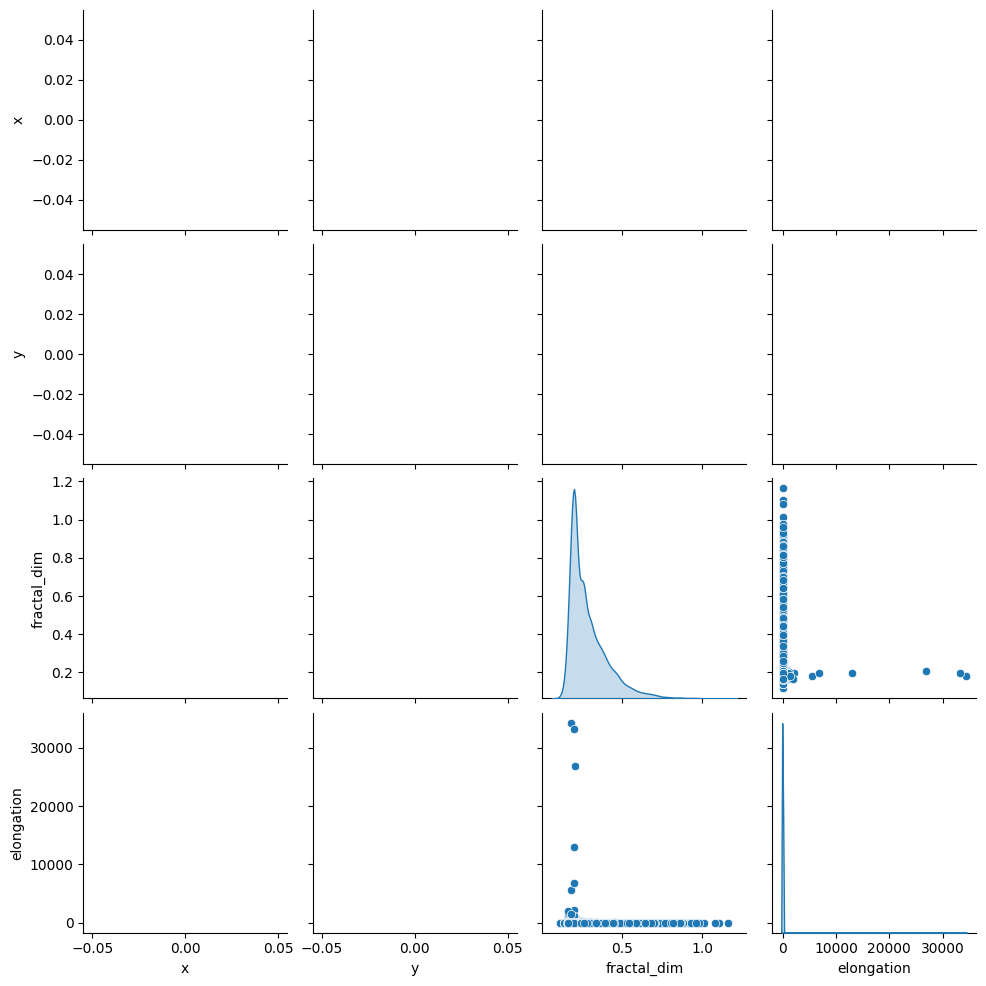

In [101]:
# Compare shape metrics to centroid coordinates
plot1_data['x'] = centroids.x
plot1_data['y'] = centroids.y
sns.pairplot(
    plot1_data,
    vars=['x', 'y', 'fractal_dim', 'elongation'],
    diag_kind='kde'
)

In [81]:
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer

# Use shape metrics only
shape_metrics = metrics_df[['fractal_dim', 'clark_evans', 'elongation', 'alpha_compactness']]

# Create imputer and fill missing values with mean
imputer = SimpleImputer(strategy='mean')
shape_metrics_imputed = pd.DataFrame(
    imputer.fit_transform(shape_metrics),
    columns=shape_metrics.columns,
    index=shape_metrics.index
)

# Perform PCA on imputed data
pca = PCA(n_components=2)
pca_results = pca.fit_transform(shape_metrics_imputed)
metrics_df[['shape_pc1', 'shape_pc2']] = pca_results

# Interpret components
print("Explained variance ratio:", pca.explained_variance_ratio_)
print("\nComponent loadings:")
print(pd.DataFrame(
    pca.components_.T,
    columns=['PC1', 'PC2'],
    index=shape_metrics.columns
))

Explained variance ratio: [9.99787488e-01 2.11942919e-04]

Component loadings:
                        PC1       PC2
fractal_dim       -0.000011 -0.012086
clark_evans        0.015401  0.999708
elongation         0.999881 -0.015399
alpha_compactness  0.000011  0.014167


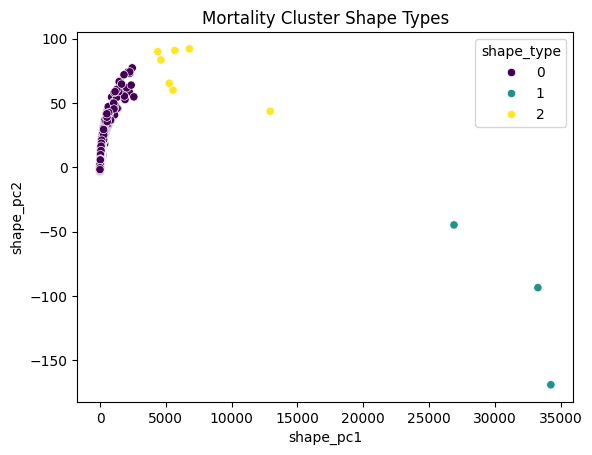

In [83]:
# K-means clustering on shape metrics
kmeans = KMeans(n_clusters=3, random_state=0)
metrics_df['shape_type'] = kmeans.fit_predict(shape_metrics_imputed)

# Plot
sns.scatterplot(
    x='shape_pc1', 
    y='shape_pc2', 
    hue='shape_type', 
    data=metrics_df,
    palette='viridis'
)
plt.title('Mortality Cluster Shape Types')
plt.show()

In [94]:
clustered_data = clustered_data.merge(
    metrics_df[['cluster_id', 'shape_type']].rename(columns={'cluster_id': 'cluster'}), 
    on='cluster'
)

clustered_data.head()

,image_name,max_value,alku_aika,geometry,cluster,plot_id,shape_type
0,L3423E_2023_RGBNIR.tif,0.630879,14.6.2023 08.10.00,POINT (248511.981 6743905.089),0,0,0
1,L3423E_2023_RGBNIR.tif,0.153389,14.6.2023 08.10.00,POINT (248524.691 6743909.463),0,0,0
2,L3423E_2023_RGBNIR.tif,-0.171656,14.6.2023 08.10.00,POINT (248521.576 6743909.454),0,0,0
3,L3423E_2023_RGBNIR.tif,-0.002479,14.6.2023 08.10.00,POINT (248504.906 6743918.138),0,0,0
4,L3423E_2023_RGBNIR.tif,0.490425,14.6.2023 08.10.00,POINT (248494.609 6743932.438),0,0,0


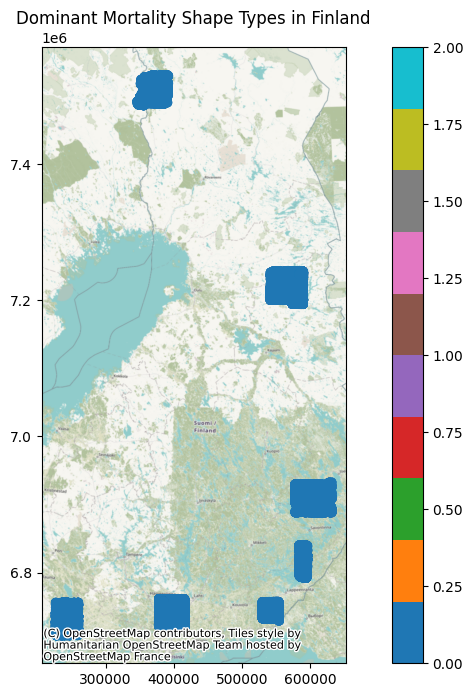

In [95]:
import contextily as ctx

# Plot dominant type per region
fig, ax = plt.subplots(figsize=(12, 8))
clustered_data.plot(
    column='shape_type', 
    legend=True, 
    ax=ax, 
    cmap='tab10'
)
ctx.add_basemap(ax, crs=clustered_data.crs.to_string())
plt.title('Dominant Mortality Shape Types in Finland')
plt.show()

In [40]:
from esda.moran import Moran
from libpysal.weights import DistanceBand

# Spatial weights matrix (50 km neighborhood)
coords = np.array([[geom.x, geom.y] for geom in plot_centroids.geometry])
w = DistanceBand(coords, threshold=50000, binary=False)

# Moran's I for total dead trees per plot
moran = Moran(plot_metrics['n_points'].values, w, permutations=999)
print(f"Global Moran's I: {moran.I:.3f} (p={moran.p_sim:.3f})")

# Interpretation:
# I > 0: Plots with similar dead tree counts cluster spatially
# I ≈ 0: Random spatial pattern
# I < 0: Dispersed pattern

('WARNING: ', 0, ' is an island (no neighbors)')
('WARNING: ', 1, ' is an island (no neighbors)')
('WARNING: ', 2, ' is an island (no neighbors)')
('WARNING: ', 3, ' is an island (no neighbors)')
('WARNING: ', 4, ' is an island (no neighbors)')
('WARNING: ', 5, ' is an island (no neighbors)')
('WARNING: ', 6, ' is an island (no neighbors)')
Global Moran's I: nan (p=0.001)


/Users/anisr/Documents/TreeClusters/venv/lib/python3.12/site-packages/scipy/sparse/_data.py:128: RuntimeWarning: divide by zero encountered in reciprocal
  return self._with_data(data ** n)
/Users/anisr/Documents/TreeClusters/venv/lib/python3.12/site-packages/libpysal/weights/util.py:826: UserWarning: The weights matrix is not fully connected: 
 There are 7 disconnected components.
 There are 7 islands with ids: 0, 1, 2, 3, 4, 5, 6.
  w = W(neighbors, weights, ids, **kwargs)
/Users/anisr/Documents/TreeClusters/venv/lib/python3.12/site-packages/libpysal/weights/distance.py:844: UserWarning: The weights matrix is not fully connected: 
 There are 7 disconnected components.
 There are 7 islands with ids: 0, 1, 2, 3, 4, 5, 6.
  W.__init__(
/Users/anisr/Documents/TreeClusters/venv/lib/python3.12/site-packages/esda/moran.py:250: RuntimeWarning: invalid value encountered in scalar divide
  self.VI_norm = v_num / v_den - (1.0 / (n - 1)) ** 2
/Users/anisr/Documents/TreeClusters/venv/lib/python3.

In [93]:
# 1. Compute cluster centroids
clustered_data = clustered_data.to_crs("EPSG:3067")  # Finland CRS
centroids = clustered_data.dissolve(by='cluster').centroid
centroid_coords = np.array([[geom.x, geom.y] for geom in centroids])

# 2. Build weights matrix (5 km neighborhood)
w = DistanceBand(centroid_coords, threshold=5000, binary=False, alpha=1.0)

# 3. Align metrics_df with centroids
metrics_df = metrics_df[metrics_df['cluster_id'].isin(centroids.index)]
metrics_df = metrics_df.set_index('cluster_id').loc[centroids.index].reset_index()

# 4. Calculate Moran's I
moran = Moran(metrics_df['n_points'].values, w, permutations=999)
print(f"Global Moran's I: {moran.I:.3f}")
print(f"P-value: {moran.p_sim:.3f}")

# 5. Visualize local spatial autocorrelation
from splot.esda import moran_scatterplot
moran_scatterplot(moran, aspect_equal=True)
plt.show()

/Users/anisr/Documents/TreeClusters/venv/lib/python3.12/site-packages/libpysal/weights/util.py:826: UserWarning: The weights matrix is not fully connected: 
 There are 8 disconnected components.
  w = W(neighbors, weights, ids, **kwargs)
/Users/anisr/Documents/TreeClusters/venv/lib/python3.12/site-packages/libpysal/weights/distance.py:844: UserWarning: The weights matrix is not fully connected: 
 There are 8 disconnected components.
  W.__init__(


Global Moran's I: 0.010
P-value: 0.001


ModuleNotFoundError: No module named 'splot'

In [95]:
import geopandas as gpd
from sklearn.cluster import DBSCAN

# Get centroids of mortality clusters
centroids = clustered_data.dissolve(by='cluster').centroid
centroid_coords = np.array([[geom.x, geom.y] for geom in centroids])

# Cluster centroids into "plots" (adjust eps based on plot separation, e.g., 10 km)
plot_eps = 10000  # 10 km (adjust based on Finnish plot spacing)
plot_labels = DBSCAN(eps=plot_eps, min_samples=1).fit(centroid_coords).labels_

# Assign plot IDs to clustered_data
clustered_data['plot_id'] = clustered_data['cluster'].map(
    dict(zip(clustered_data['cluster'].unique(), plot_labels)))

In [107]:
print(clustered_data.columns)
print(metrics_df.columns)

Index(['image_name', 'max_value', 'alku_aika', 'geometry', 'cluster',
       'plot_id'],
      dtype='object')
Index(['cluster', 'n_points', 'area', 'perimeter', 'form_factor', 'elongation',
       'fractal_dim', 'pca_angle', 'clark_evans', 'alpha_compactness',
       'cluster_type'],
      dtype='object')


In [ ]:
plot_metrics = clustered_data.groupby('plot_id').agg({
    'n_points': 'sum',        # Total dead trees per plot
    'cluster': 'count',       # Number of clusters per plot
    'area': 'mean',           # Mean cluster area
    'elongation': 'mean'      # Mean cluster elongation
}).reset_index()

KeyError: "Column(s) ['area', 'elongation', 'n_points'] do not exist"

In [64]:
# Ensure 'cluster' is the common key
print(clustered_data['cluster'].dtype)  # Should be int/str
print(metrics_df.index.dtype)           # Should match 'cluster' dtype

# If metrics_df lacks 'cluster', reset its index
metrics_df = metrics_df.reset_index().rename(columns={'index': 'cluster'})

int64
int64


In [65]:
# Dissolve by 'cluster' and get centroids (EPSG:3067 for Finland)
centroids = clustered_data.dissolve(by='cluster').centroid
centroid_coords = np.array([[geom.x, geom.y] for geom in centroids])

In [66]:
# Filter metrics_df to match dissolved clusters
metrics_df = metrics_df[metrics_df['cluster'].isin(centroids.index)]
metrics_df = metrics_df.set_index('cluster').loc[centroids.index].reset_index()

ValueError: cannot reindex on an axis with duplicate labels

In [54]:
from esda.moran import Moran
from libpysal.weights import DistanceBand

# Weights matrix (5 km neighborhood for boreal processes)
w = DistanceBand(centroid_coords, threshold=5000, binary=False)

# Moran's I for cluster size ('n_points')
moran = Moran(metrics_df['n_points'].values, w, permutations=999)
print(f"Global Moran's I: {moran.I:.3f} (p={moran.p_sim:.3f})")

# Interpret:
# I > 0: Clustered spatial pattern (e.g., regional pest outbreaks)
# I ≈ 0: Random
# I < 0: Dispersed

/Users/anisr/Documents/TreeClusters/venv/lib/python3.12/site-packages/scipy/sparse/_data.py:128: RuntimeWarning: divide by zero encountered in reciprocal
  return self._with_data(data ** n)
/Users/anisr/Documents/TreeClusters/venv/lib/python3.12/site-packages/libpysal/weights/util.py:826: UserWarning: The weights matrix is not fully connected: 
 There are 8 disconnected components.
  w = W(neighbors, weights, ids, **kwargs)
/Users/anisr/Documents/TreeClusters/venv/lib/python3.12/site-packages/libpysal/weights/distance.py:844: UserWarning: The weights matrix is not fully connected: 
 There are 8 disconnected components.
  W.__init__(


Global Moran's I: 0.027 (p=0.001)


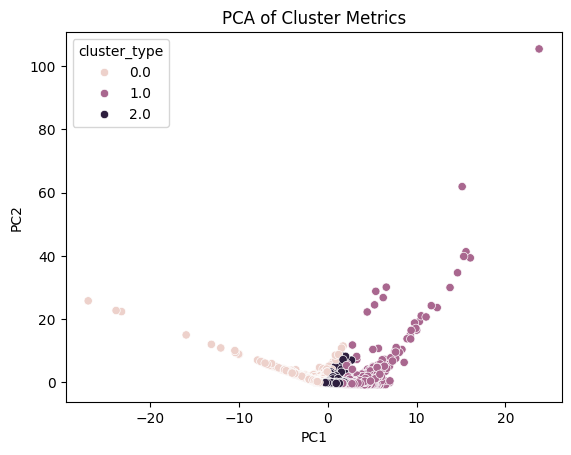

In [57]:
from sklearn.decomposition import PCA

# Standardize metrics (handle NaN values by imputing with column mean)
X = metrics_df[['n_points', 'fractal_dim', 'clark_evans', 'alpha_compactness']]
X = X.fillna(X.mean())  # Impute missing values with column mean
X_std = (X - X.mean()) / X.std()

# Reduce to 2 components
pca = PCA(n_components=2)
metrics_df[['PC1', 'PC2']] = pca.fit_transform(X_std)

# Plot
sns.scatterplot(x='PC1', y='PC2', hue='cluster_type', data=metrics_df)
plt.title('PCA of Cluster Metrics')
plt.show()

In [58]:
loadings = pd.DataFrame(
    pca.components_.T,
    columns=['PC1', 'PC2'],
    index=X.columns
)
print(loadings)

# PC1: High positive loadings for 'n_points' and 'alpha_compactness' → Size/shape axis
# PC2: High loadings for 'fractal_dim' → Complexity axis

                        PC1       PC2
n_points           0.215635  0.923719
fractal_dim        0.654523  0.002236
clark_evans       -0.373578  0.369565
alpha_compactness -0.620919  0.100800


AttributeError: PathCollection.set() got an unexpected keyword argument 'legend'

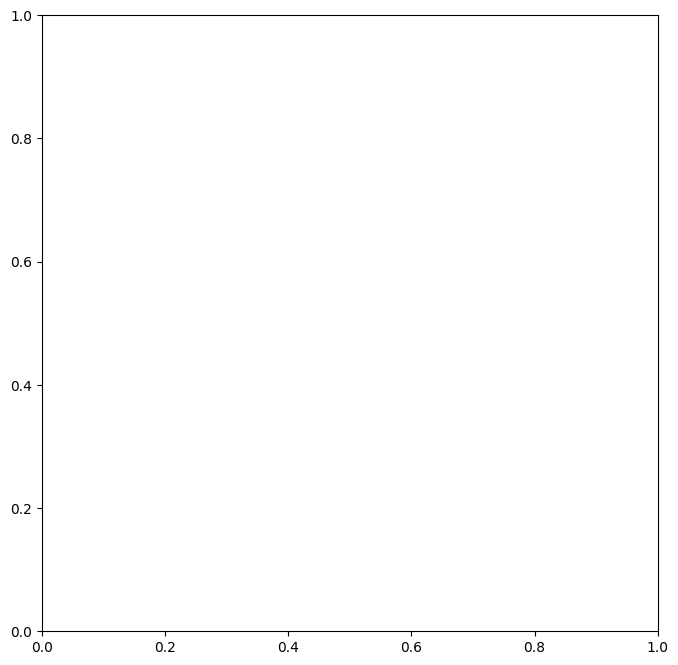

In [59]:
from esda.moran import Moran_Local

# Local Moran's I
lisa = Moran_Local(metrics_df['n_points'].values, w, permutations=999)
metrics_df['lisa_p'] = lisa.p_sim
metrics_df['hotspot'] = lisa.q  # 1=HH, 2=LH, 3=LL, 4=HL

# Map significant hotspots (p < 0.05)
hotspots = centroids.to_crs(epsg=3857)[metrics_df['lisa_p'] < 0.05]
ax = hotspots.plot(
    c=metrics_df.loc[metrics_df['lisa_p'] < 0.05, 'hotspot'],
    cmap='RdYlBu', 
    legend=True,
    figsize=(12, 8)
)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.title('Tree Mortality Hotspots (p < 0.05)')
plt.show()

In [ ]:
# Compare PCA angles to dominant wind direction (e.g., 120° = SE in Finland)
wind_direction = 120  # Adjust based on Finnish Meteorological Institute data
angles_diff = np.abs(metrics_df['pca_angle'] - wind_direction)
angles_diff = np.minimum(angles_diff, 360 - angles_diff)  # Circular difference

# Plot alignment
plt.figure(figsize=(8, 6))
sns.histplot(angles_diff, bins=30, kde=True)
plt.axvline(x=30, color='red', linestyle='--', label='±30° Threshold')
plt.xlabel('Deviation from Dominant Wind Direction (Degrees)')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [45]:
ema10_vals = np.array([138.22, 138.37, 138.45])
# Compute percentage changes from the first EMA10 value in this window.
base = ema10_vals[0]
pct_changes = (ema10_vals - base) / base  # relative changes

# Use indices as x values (0, 1, ..., 4)
x = np.arange(len(pct_changes))
slope = np.polyfit(x, pct_changes, 1)[0]  # slope in % change per time unit
# Convert the slope to an angle (in degrees)
slope_angle = np.degrees(np.arctan(slope))

print(slope_angle)

# Use x values 0 to 4 (assuming equal time intervals).

x = np.arange(len(ema10_vals))
slope = np.polyfit(x, ema10_vals, 1)[0]
# Convert the slope to an angle in degrees.
slope_angle = np.degrees(np.arctan(slope))

print(slope_angle)

0.04767047550008246
6.560196400570173


         cluster_id      n_points          area     perimeter   form_factor  \
count  23346.000000  23346.000000  2.334600e+04  23346.000000  23345.000000   
mean   11673.682173     16.991390  6.880511e+03    260.164627      0.572223   
std     6740.372312     68.504966  3.893039e+04    240.436430      0.162799   
min        0.000000      1.000000  0.000000e+00      0.000000      0.011796   
25%     5837.250000      6.000000  7.431788e+02    144.230890      0.468867   
50%    11673.500000      8.000000  1.752304e+03    198.504757      0.593448   
75%    17510.750000     14.000000  4.435399e+03    297.161504      0.693979   
max    23348.000000   5083.000000  2.913002e+06   6221.107730      0.945835   

         elongation  
count  23345.000000  
mean       2.830091  
std        2.532169  
min        1.000042  
25%        1.562384  
50%        2.232535  
75%        3.266379  
max      170.621623  


KeyboardInterrupt: 

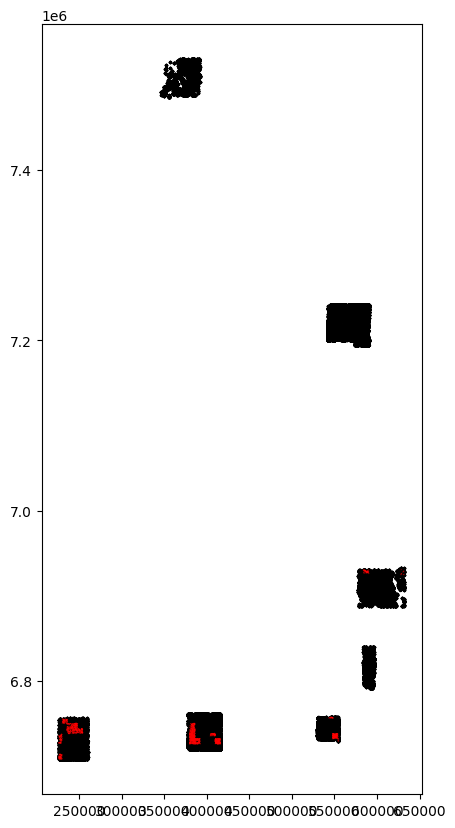

In [7]:
# Summary statistics
print(metrics_df.describe())

# Plot clusters with convex hulls
fig, ax = plt.subplots(figsize=(10, 10))
clustered_data.plot(ax=ax, color='black', markersize=2, label='Tree Locations')

for cluster_id in clustered_data['cluster'].unique():
    cluster_points = clustered_data[clustered_data['cluster'] == cluster_id].geometry
    multipoint = MultiPoint(cluster_points.tolist())
    convex_hull = multipoint.convex_hull
    if not convex_hull.is_empty:
        gpd.GeoSeries(convex_hull).boundary.plot(ax=ax, color='red', linewidth=1)

plt.title('Tree Mortality Clusters with Convex Hulls')
plt.show()